## About

This starter code shows how to read slides and tumor masks from the [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. It will install [OpenSlide](https://openslide.org/) in Colab (the only non-Python dependency). Note that OpenSlide also includes a [DeepZoom viewer](https://github.com/openslide/openslide-python/tree/master/examples/deepzoom), shown in class. To use that, you'll need to install and run OpenSlide locally on your computer.

### Training data

The original slides and annotations are in an unusual format. I converted a bunch of them for you, so you can read them with OpenSlide as shown in this notebook. These will be uploaded for you the week of Oct 24th, at which point we'll update this notebook with a link. 

**Update:** This Google Drive [folder](https://drive.google.com/drive/folders/11GEhOPP0T4Oaw_Yhb4jD_fh79DNXq8no?usp=sharing) contains many additional slides and masks you can use. Note that while the starter code below downloads one slide from a Google Cloud URL (we have hosted this online for you for convenience), you will need to find a way to work with the other slides yourself for practice. You do not need to use them all! Just a few. You can either host the slides you'll use on Cloud storage using any provider, or you can download from Google Drive in your notebook (this may be slow).

Note that even with the starter code, it will take some effort to understand how to work with this data (the various zoom levels, and the coordinate system).

### Goals and grading

The goal for your project is to build a thoughtful, end-to-end prototype - not to match the accuracy from the [paper](https://arxiv.org/abs/1703.02442), and not necessarily to use all the available data. To receive an A on this work, your project should (for example):
- Use multiple zoom levels
- Use high-magnification images
- Include several visualizations of your results (both heatmaps showing predictions on individual slides, and other metrics/diagrams you design that are appropriate to communicate how well your model performs).

You are also welcome to propose a custom project of similar scope, on any topic of interest to you.

In [ ]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.resnet50 import ResNet50

In [ ]:
# Download an example slide and tumor mask

# Note: the remainder of the training data are in the Google Drive folder linked above.
# You will need to host them on your own, either in Google Drive, or by using
# the cloud provider of your choice.

slide_path = 'tumor_091.tif' # only this file is available
tumor_mask_path = 'tumor_091_mask.tif' # only this file is available

slide_url = 'https://storage.googleapis.com/applied-dl/%s' % slide_path
mask_url = 'https://storage.googleapis.com/applied-dl/%s' % tumor_mask_path

# Download the whole slide image
if not os.path.exists(slide_path):
  !curl -O $slide_url

# Download the tumor mask
if not os.path.exists(tumor_mask_path):
  !curl -O $mask_url

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  521M  100  521M    0     0   106M      0  0:00:04  0:00:04 --:--:--  108M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 14.6M  100 14.6M    0     0  15.2M      0 --:--:-- --:--:-- --:--:-- 15.2M


In [ ]:
slide = open_slide(slide_path)
print ("Read WSI from %s with width: %d, height: %d" % (slide_path, 
                                                        slide.level_dimensions[0][0], 
                                                        slide.level_dimensions[0][1]))

tumor_mask = open_slide(tumor_mask_path)
print ("Read tumor mask from %s" % (tumor_mask_path))

print("Slide includes %d levels", len(slide.level_dimensions))
for i in range(len(slide.level_dimensions)):
    print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                             slide.level_dimensions[i], 
                                                             slide.level_downsamples[i]))
    assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
    assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

# Verify downsampling works as expected
width, height = slide.level_dimensions[7]
assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]

Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
Slide includes %d levels 8
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 4
Level 3, dimensions: (7680, 6720) downsample factor 8
Level 4, dimensions: (3840, 3360) downsample factor 16
Level 5, dimensions: (1920, 1680) downsample factor 32
Level 6, dimensions: (960, 840) downsample factor 64
Level 7, dimensions: (480, 420) downsample factor 128


In [ ]:
# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x, y), level, (width, height))
    im = im.convert('RGB')  # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

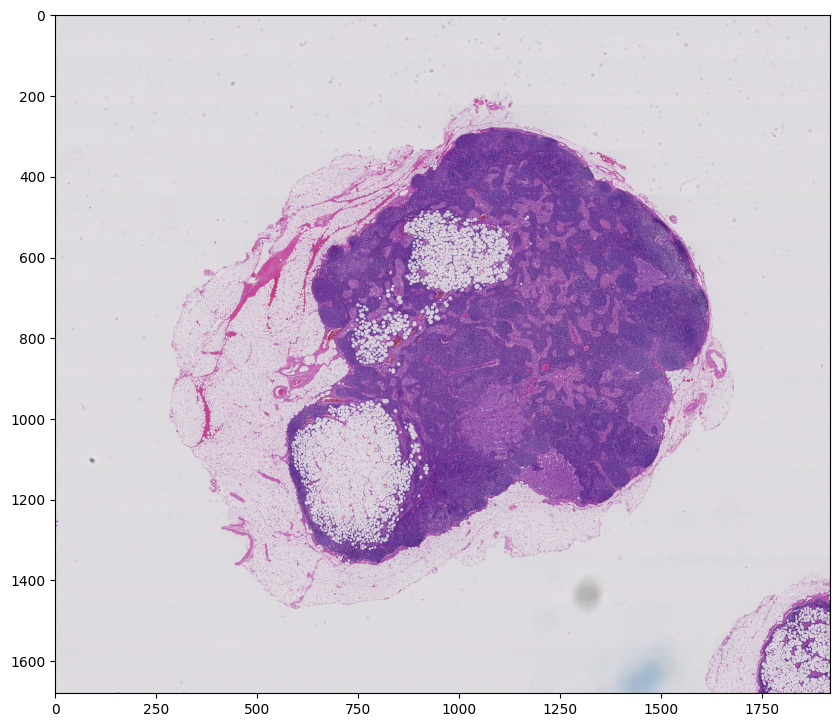

In [ ]:
# Example: read the entire slide at level 5

# Higher zoom levels may not fit into memory.
# You can use the below function to extract regions from higher zoom levels 
# without having to read the entire image into ram.

# Use the sliding window approach discussed in class to collect training
# data for your classifier. E.g., slide a window across the slide (for
# starters, use a zoomed out view, so you're not working with giant images).
# Save each window to disk as an image. To find the label for that image, 
# check to the tissue mask to see if the same region contains cancerous cells.

# Important: this is tricky to get right. Carefully debug your pipeline before
# training your model. Start with just a single image, and a relatively 
# low zoom level.

slide_image = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=5, 
                         width=slide.level_dimensions[5][0], 
                         height=slide.level_dimensions[5][1])

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)

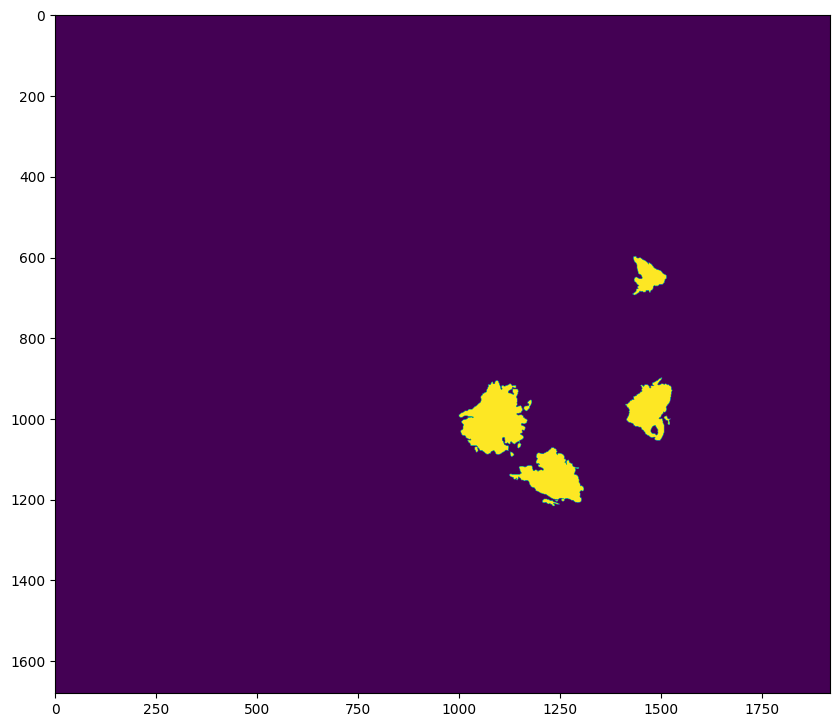

In [ ]:
# Example: read the entire mask at the same zoom level
mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=5, 
                        width=slide.level_dimensions[5][0], 
                        height=slide.level_dimensions[5][1])

# Note: the program provided by the dataset authors generates a mask with R,G,B channels.
# The mask info we need is in the first channel only.
# If you skip this step, the mask will be displayed as all black.
mask_image = mask_image[:,:,0]

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(mask_image)
# print(mask_image)

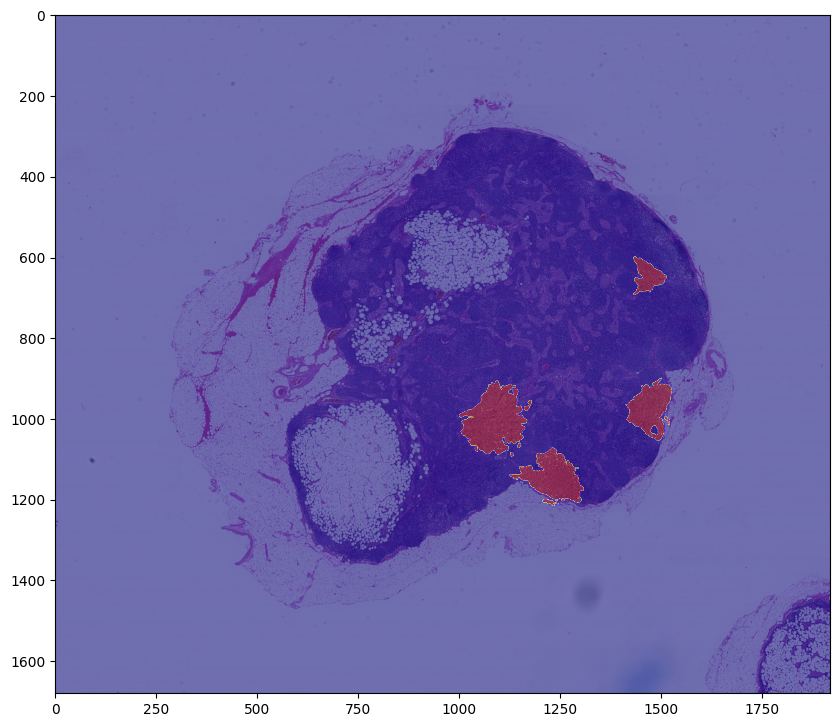

In [ ]:
# Overlay them. The idea is that the mask shows the region of the slide that
# contain cancerous cells.
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)
plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer.

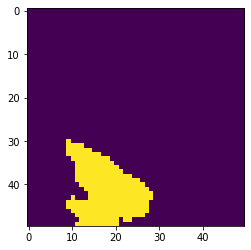

In [ ]:
# Example: extract a region from the L7 downsampled image
# Notice we're multiplying the x,y coordinates by the downsample factor.
# This math can be tricky to get right, debug carefully.
# Here, we're "aiming" for the top right blob in the image above.
region = read_slide(tumor_mask, x=350 * 128, y=120 * 128, level=7, width=50, height=50)[:,:,0]
plt.imshow(region)

905504 tissue_pixels pixels (32.1 percent of the image)


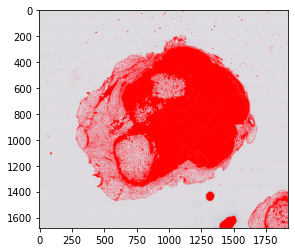

In [ ]:
# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

tissue_pixels = find_tissue_pixels(slide_image)
percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

tissue_regions = apply_mask(slide_image, tissue_pixels)
plt.imshow(tissue_regions)

In [ ]:
# Import tensorflow
import tensorflow as tf

In [ ]:
print(tf.__version__)

2.9.2


## Fetch Data and Download it

In [ ]:
# Mounted to google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Simple sanity check to see whether we successfully mounted the slides folder
!ls /content/gdrive/MyDrive/slides

tumor_001_mask.tif  tumor_019.xml	tumor_059.xml	    tumor_091.tif
tumor_001.tif	    tumor_023_mask.tif	tumor_064_mask.tif  tumor_091.xml
tumor_001.xml	    tumor_023.tif	tumor_064.tif	    tumor_094_mask.tif
tumor_002_mask.tif  tumor_023.xml	tumor_064.xml	    tumor_094.tif
tumor_002.tif	    tumor_031_mask.tif	tumor_075_mask.tif  tumor_094.xml
tumor_002.xml	    tumor_031.tif	tumor_075.tif	    tumor_096_mask.tif
tumor_005_mask.tif  tumor_031.xml	tumor_075.xml	    tumor_096.tif
tumor_005.tif	    tumor_035_mask.tif	tumor_078_mask.tif  tumor_096.xml
tumor_005.xml	    tumor_035.tif	tumor_078.tif	    tumor_101_mask.tif
tumor_012_mask.tif  tumor_035.xml	tumor_078.xml	    tumor_101.tif
tumor_012.tif	    tumor_038.tif	tumor_081_mask.tif  tumor_101.xml
tumor_012.xml	    tumor_038.xml	tumor_081.tif	    tumor_110_mask.tif
tumor_016_mask.tif  tumor_057_mask.tif	tumor_081.xml	    tumor_110.tif
tumor_016.tif	    tumor_057.tif	tumor_084_mask.tif  tumor_110.xml
tumor_016.xml	    tumor_057.xml	tumor_084.ti

In [ ]:
# Stored the slides folder path in the slides_path variable
slides_path = "/content/gdrive/MyDrive/slides"

### Connecting to GCS bucket

In [ ]:
# Connect to the deep learning project in Google Cloud and list all buckets
from google.colab import auth
auth.authenticate_user()
project_id = 'deeplearning-370400'
!gcloud config set project {project_id}
!gsutil ls

Updated property [core/project].
gs://coms4995_finalproject/
gs://resized_images_dl4995/


The part below copied data from google drive to GCS bucket. It should only be done once. So I commented this cell after I finished this step.

In [ ]:
# Copy data from or to GCS using gsutil cp command
# Using the -m option for gsutil will enable multi-threading and speed up the copy process significantly.


# bucket_name = "coms4995_finalproject"
# !gsutil -m cp -r /content/gdrive/MyDrive/slides/* gs://{bucket_name}/

### Download Data from Google Storage to Google Colab

In [ ]:
DRIVE_DATA_DIR = "/content/gdrive/MyDrive/slides"
GOOGLE_STORAGE_URL = "https://storage.googleapis.com/coms4995_finalproject/"

for path in os.listdir(DRIVE_DATA_DIR):
  slide_path = GOOGLE_STORAGE_URL + path
  print(slide_path)
  # Download the whole slide image
  !curl -O $slide_path


https://storage.googleapis.com/coms4995_finalproject/tumor_064.xml
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1356k  100 1356k    0     0  41.4M      0 --:--:-- --:--:-- --:--:-- 42.7M
https://storage.googleapis.com/coms4995_finalproject/tumor_012.xml
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 39763  100 39763    0     0  2773k      0 --:--:-- --:--:-- --:--:-- 2773k
https://storage.googleapis.com/coms4995_finalproject/tumor_005.xml
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  129k  100  129k    0     0  8630k      0 --:--:-- --:--:-- --:--:-- 8630k
https://storage.googleapis.com/coms4995_finalproject/tumor_035.xml
  % Total    % Receiv

In [ ]:
!ls

gdrive		    tumor_016.xml	tumor_059_mask.tif  tumor_091_mask.tif
my_model.h5	    tumor_019_mask.tif	tumor_059.tif	    tumor_091.tif
sample_data	    tumor_019.tif	tumor_059.xml	    tumor_091.xml
slides		    tumor_019.xml	tumor_064_mask.tif  tumor_094_mask.tif
tumor_001_mask.tif  tumor_023_mask.tif	tumor_064.tif	    tumor_094.tif
tumor_001.tif	    tumor_023.tif	tumor_064.xml	    tumor_094.xml
tumor_001.xml	    tumor_023.xml	tumor_075_mask.tif  tumor_096_mask.tif
tumor_002_mask.tif  tumor_031_mask.tif	tumor_075.tif	    tumor_096.tif
tumor_002.tif	    tumor_031.tif	tumor_075.xml	    tumor_096.xml
tumor_002.xml	    tumor_031.xml	tumor_078_mask.tif  tumor_101_mask.tif
tumor_005_mask.tif  tumor_035_mask.tif	tumor_078.tif	    tumor_101.tif
tumor_005.tif	    tumor_035.tif	tumor_078.xml	    tumor_101.xml
tumor_005.xml	    tumor_035.xml	tumor_081_mask.tif  tumor_110_mask.tif
tumor_012_mask.tif  tumor_038.tif	tumor_081.tif	    tumor_110.tif
tumor_012.tif	    tumor_038.xml	tumor_081.xml	    tumor_1

In [ ]:
# count = 0
files = []
for file in os.listdir("/content"):
  if file.startswith("tumor"):
    files.append(file)
print(files)

['tumor_023.tif', 'tumor_081.tif', 'tumor_001_mask.tif', 'tumor_110_mask.tif', 'tumor_012.xml', 'tumor_075.tif', 'tumor_078.xml', 'tumor_012_mask.tif', 'tumor_091.xml', 'tumor_094.tif', 'tumor_016_mask.tif', 'tumor_001.tif', 'tumor_031.xml', 'tumor_084.xml', 'tumor_064_mask.tif', 'tumor_005.xml', 'tumor_035_mask.tif', 'tumor_101_mask.tif', 'tumor_096.xml', 'tumor_094_mask.tif', 'tumor_031_mask.tif', 'tumor_096.tif', 'tumor_002.xml', 'tumor_078.tif', 'tumor_059.xml', 'tumor_091.tif', 'tumor_002_mask.tif', 'tumor_002.tif', 'tumor_057.tif', 'tumor_084.tif', 'tumor_081_mask.tif', 'tumor_012.tif', 'tumor_016.xml', 'tumor_094.xml', 'tumor_091_mask.tif', 'tumor_101.xml', 'tumor_075_mask.tif', 'tumor_016.tif', 'tumor_023_mask.tif', 'tumor_005.tif', 'tumor_019.tif', 'tumor_064.tif', 'tumor_084_mask.tif', 'tumor_057.xml', 'tumor_110.tif', 'tumor_035.xml', 'tumor_038.tif', 'tumor_059_mask.tif', 'tumor_019_mask.tif', 'tumor_001.xml', 'tumor_081.xml', 'tumor_064.xml', 'tumor_057_mask.tif', 'tumor_0

In [ ]:
!pwd

/content


In [ ]:
!mkdir "/content/slides/"

mkdir: cannot create directory ‘/content/slides/’: File exists


In [ ]:
# Move slides into a slides directory in colab
!mv /content/tumor* /content/slides/

In [ ]:
# Simple sanity check the number of files 
count = 0
for file in os.listdir("/content/slides"):
  count += 1
print(count)

65


In [ ]:
# Saving tumors and tumor masks into lists
tumor_names = []
tumor_mask_names = []

slides_url = "/content/slides/"
for slide in os.listdir(slides_url):
  # Skip tumor_38 since it doesn't have no mask
    if "tif" in slide and '38' not in slide: 
        if "mask" in slide:
            # tumor_masks.append(open_slide(slides_url + slide))
            tumor_mask_names.append(slide)
        else:
            # tumors.append(open_slide(slides_url + slide))
            tumor_names.append(slide)

# print(tumor_masks)
# print(tumors)

In [ ]:
print(tumor_mask_names)
print(tumor_names)

['tumor_001_mask.tif', 'tumor_110_mask.tif', 'tumor_012_mask.tif', 'tumor_016_mask.tif', 'tumor_064_mask.tif', 'tumor_035_mask.tif', 'tumor_101_mask.tif', 'tumor_094_mask.tif', 'tumor_031_mask.tif', 'tumor_002_mask.tif', 'tumor_081_mask.tif', 'tumor_091_mask.tif', 'tumor_075_mask.tif', 'tumor_023_mask.tif', 'tumor_084_mask.tif', 'tumor_059_mask.tif', 'tumor_019_mask.tif', 'tumor_057_mask.tif', 'tumor_078_mask.tif', 'tumor_096_mask.tif', 'tumor_005_mask.tif']
['tumor_023.tif', 'tumor_081.tif', 'tumor_075.tif', 'tumor_094.tif', 'tumor_001.tif', 'tumor_096.tif', 'tumor_078.tif', 'tumor_091.tif', 'tumor_002.tif', 'tumor_057.tif', 'tumor_084.tif', 'tumor_012.tif', 'tumor_016.tif', 'tumor_005.tif', 'tumor_019.tif', 'tumor_064.tif', 'tumor_110.tif', 'tumor_059.tif', 'tumor_101.tif', 'tumor_035.tif', 'tumor_031.tif']


In [ ]:
tumor_mask_names = sorted(tumor_mask_names)
tumor_names = sorted(tumor_names)

In [ ]:
print(tumor_mask_names)
print(tumor_names)

['tumor_001_mask.tif', 'tumor_002_mask.tif', 'tumor_005_mask.tif', 'tumor_012_mask.tif', 'tumor_016_mask.tif', 'tumor_019_mask.tif', 'tumor_023_mask.tif', 'tumor_031_mask.tif', 'tumor_035_mask.tif', 'tumor_057_mask.tif', 'tumor_059_mask.tif', 'tumor_064_mask.tif', 'tumor_075_mask.tif', 'tumor_078_mask.tif', 'tumor_081_mask.tif', 'tumor_084_mask.tif', 'tumor_091_mask.tif', 'tumor_094_mask.tif', 'tumor_096_mask.tif', 'tumor_101_mask.tif', 'tumor_110_mask.tif']
['tumor_001.tif', 'tumor_002.tif', 'tumor_005.tif', 'tumor_012.tif', 'tumor_016.tif', 'tumor_019.tif', 'tumor_023.tif', 'tumor_031.tif', 'tumor_035.tif', 'tumor_057.tif', 'tumor_059.tif', 'tumor_064.tif', 'tumor_075.tif', 'tumor_078.tif', 'tumor_081.tif', 'tumor_084.tif', 'tumor_091.tif', 'tumor_094.tif', 'tumor_096.tif', 'tumor_101.tif', 'tumor_110.tif']


In [ ]:
print("There are %d slides-mask pairs." % len(tumor_mask_names))

There are 21 slides-mask pairs.


## Helper Function

### Read Slides

In [ ]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

### Find Tissue Pixels

In [ ]:
# Improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
# Mainly used to calculate the percentage of tissue area.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

### Apply Mask

In [ ]:
def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

### Plot Helpers

In [ ]:
def display_predicted_mask(slide, predicted_mask, mask, level=5):

    slide_image = read_slide(slide, 
                             x=0, 
                             y=0, 
                             level=level, 
                             width=slide.level_dimensions[level][0], 
                             height=slide.level_dimensions[level][1])
    # plt.figure(figsize=(10,10), dpi=100)
    # plt.imshow(slide_image)
    # plt.title("slide")


    mask_image = read_slide(mask, 
                            x=0, 
                            y=0, 
                            level=level, 
                            width=mask.level_dimensions[level][0], 
                            height=mask.level_dimensions[level][1])
    mask_image = mask_image[:,:,0]  
    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(mask_image)
    plt.title("mask")

    # plt.figure(figsize=(10,10), dpi=100)
    # plt.imshow(predicted_mask, cmap='jet', alpha=0.5)
    # plt.title("predicted mask")

    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(slide_image)
    plt.imshow(mask_image, cmap='jet', alpha=0.5)
    plt.title("actual cancerous region")


    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(slide_image)
    plt.imshow(predicted_mask, cmap='jet', alpha=0.5)
    plt.title("predicted cancerous region")

    plt.figure(figsize=(10,10), dpi=100)
    plt.imshow(mask_image)
    plt.imshow(predicted_mask, cmap='jet', alpha=0.5)
    plt.title("overlay predicted mask with actual mask")


In [ ]:
def plot(history):
  # The history object contains results on the training and test
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  # Get the number of epochs
  epochs = range(len(acc))

  plt.title('Training and validation accuracy')
  plt.plot(epochs, acc, label='Train')
  plt.plot(epochs, val_acc, label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()

  _ = plt.figure()
  plt.title('Training and validation loss')
  plt.plot(epochs, loss, label='Train')
  plt.plot(epochs, val_loss, label='Val')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()

#### HeatMap Creation

In [ ]:
def create_heatmap(slide, model, patch_dim=75, level=5):
    """
    :type slide: slide that's needed to be predicted
    :type model: prediction model
    :type patch_dim: the dimension of the patch, default value is 75
    :type level: the level to make predictions on
    :rtype: return the heatmap of current slides, the red portion depicts the cancerous region
    """
    # A white patch with dimension (75, 75, 3)
    white = np.ones((patch_dim, patch_dim, 3))

    # A red patch with dimension (75, 75, 3)
    red = np.zeros((patch_dim, patch_dim, 3))

    # Only cared about one channel in RGB as the example code given above
    red[:,:,0] = np.ones((patch_dim, patch_dim))

    # Prepare the base board
    heatmap = np.ones((slide.level_dimensions[level][1], slide.level_dimensions[level][0], 3))

    # Downsample factor
    factor = 2 ** (level)

    for j in range(int(slide.level_dimensions[level][1]/patch_dim) - 1):
        for i in range(int(slide.level_dimensions[level][0]/patch_dim) - 1):

            tissue_region = read_slide(slide, 
                                       x=i * patch_dim * factor, 
                                       y=j * patch_dim * factor, 
                                       level=level, 
                                       width=patch_dim, 
                                       height=patch_dim)
            
            tissue_pixel = find_tissue_pixels(tissue_region)

            tissue_percent = len(tissue_pixel) / float(tissue_region.shape[0] * tissue_region.shape[1]) * 100

            # 1. Ignore boundary
            # 2. Ignore the patches with less than 20% tissue part
            if i == 0 or j == 0:
                heatmap[patch_dim * j : patch_dim * j + patch_dim, patch_dim * i : patch_dim * i + patch_dim, :] = white
            elif tissue_percent < 20:
                heatmap[patch_dim * j : patch_dim * j + patch_dim, patch_dim * i : patch_dim * i + patch_dim, :] = white
            else:
                tissue_region = np.expand_dims(tissue_region,axis = 0)
                res = (model.predict(tissue_region)>.5).astype(int)[0][0]
                if res == 0:
                    heatmap[patch_dim * j : patch_dim * j + patch_dim, patch_dim * i : patch_dim * i + patch_dim, :] = white
                else:
                    heatmap[patch_dim * j : patch_dim * j + patch_dim, patch_dim * i : patch_dim * i + patch_dim, :] = red 
    return heatmap

## Explore the dataset

In [ ]:
# Saving tumors and tumor masks into lists
play_tumors = []
play_tumor_masks = []

for tumor, mask in zip(tumor_names, tumor_mask_names):
  tumor_path = slides_url + tumor
  mask_path = slides_url + mask
  print(tumor,mask)
  play_tumors.append(open_slide(tumor_path))
  play_tumor_masks.append(open_slide(mask_path))

tumor_001.tif tumor_001_mask.tif
tumor_002.tif tumor_002_mask.tif
tumor_005.tif tumor_005_mask.tif
tumor_012.tif tumor_012_mask.tif
tumor_016.tif tumor_016_mask.tif
tumor_019.tif tumor_019_mask.tif
tumor_023.tif tumor_023_mask.tif
tumor_031.tif tumor_031_mask.tif
tumor_035.tif tumor_035_mask.tif
tumor_057.tif tumor_057_mask.tif
tumor_059.tif tumor_059_mask.tif
tumor_064.tif tumor_064_mask.tif
tumor_075.tif tumor_075_mask.tif
tumor_078.tif tumor_078_mask.tif
tumor_081.tif tumor_081_mask.tif
tumor_084.tif tumor_084_mask.tif
tumor_091.tif tumor_091_mask.tif
tumor_094.tif tumor_094_mask.tif
tumor_096.tif tumor_096_mask.tif
tumor_101.tif tumor_101_mask.tif
tumor_110.tif tumor_110_mask.tif


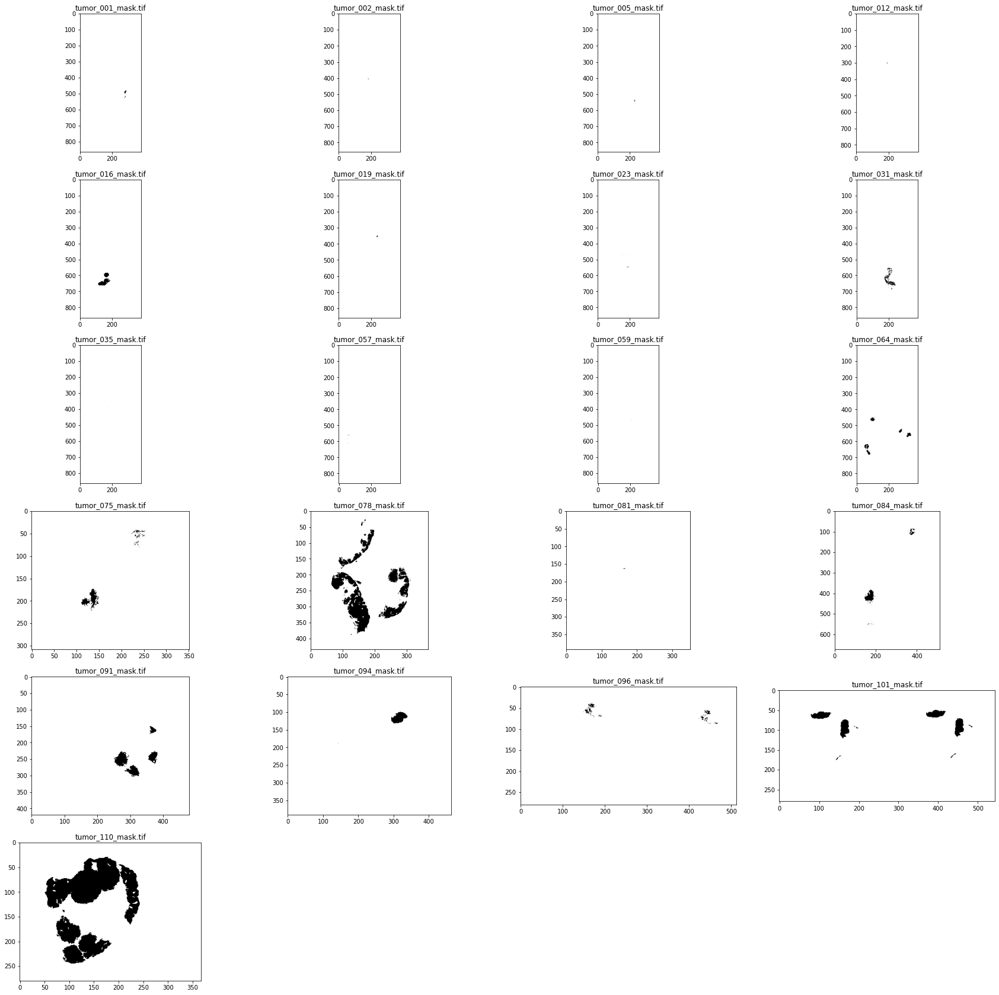

In [ ]:
# Plot the masks at the highest level

plt.figure(figsize = (30,30))
for i in range(len(play_tumors)):
    mask = play_tumor_masks[i]
    plt.subplot(np.ceil(len(play_tumor_masks) / 4), 4, i + 1)
    level = len(mask.level_dimensions) - 1
    mask_image = read_slide(mask,
                            x=0,
                            y=0,
                            level=level,
                            width=mask.level_dimensions[level][0],
                            height=mask.level_dimensions[level][1])
    mask_image = mask_image[:, :, 0]
    
    plt.imshow(mask_image, cmap=plt.cm.binary)
    plt.title(tumor_mask_names[i])
plt.show()

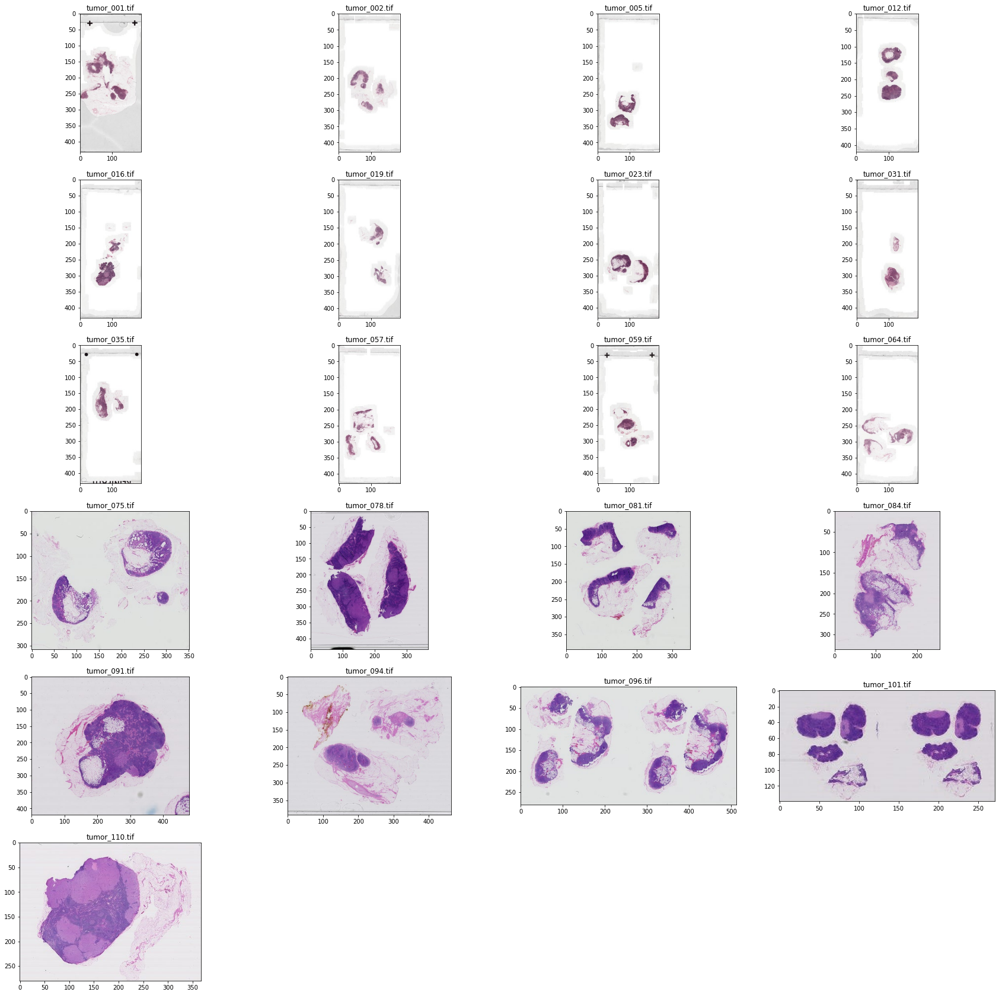

In [ ]:
plt.figure(figsize = (30,30))
for i in range(len(play_tumors)):
    play_tumor = play_tumors[i]
    plt.subplot(np.ceil(len(play_tumors) / 4), 4, i + 1)
    level = len(play_tumor.level_dimensions) - 1
    play_tumor_image = read_slide(play_tumor,
                            x=0,
                            y=0,
                            level=level,
                            width=play_tumor.level_dimensions[level][0],
                            height=play_tumor.level_dimensions[level][1])
    
    plt.imshow(play_tumor_image, cmap=plt.cm.binary)
    plt.title(tumor_names[i])
plt.show()

## Choose training slides and test slides

<h3> Choose tumor_091.tif and tumor_110.tif as the test slides

In [ ]:
slides_number = ['001', '002', '005', '012', '016', '019', '023', '031', '035',
        '057', '059', '064', '075', '078', '081', '084', '091', '094', '096',
         '101', '110']
slides=[]
tumor_masks=[]
slides_path = "/content/slides/"
test_slides = []
test_tumor_masks = []
for index in slides_number:
    print (index)
    slide_path = slides_path + 'tumor_' + index + '.tif'
    tumor_mask_path = slides_path + 'tumor_'+index+'_mask.tif'
    if index == '091' or index == '110':
      test_slides.append(open_slide(slide_path))
      test_tumor_masks.append(open_slide(tumor_mask_path))
    else:
      slides.append(open_slide(slide_path))
      tumor_masks.append(open_slide(tumor_mask_path))

len(slides)

001
002
005
012
016
019
023
031
035
057
059
064
075
078
081
084
091
094
096
101
110


19

In [ ]:
print(slides)

[OpenSlide('/content/slides/tumor_001.tif'), OpenSlide('/content/slides/tumor_002.tif'), OpenSlide('/content/slides/tumor_005.tif'), OpenSlide('/content/slides/tumor_012.tif'), OpenSlide('/content/slides/tumor_016.tif'), OpenSlide('/content/slides/tumor_019.tif'), OpenSlide('/content/slides/tumor_023.tif'), OpenSlide('/content/slides/tumor_031.tif'), OpenSlide('/content/slides/tumor_035.tif'), OpenSlide('/content/slides/tumor_057.tif'), OpenSlide('/content/slides/tumor_059.tif'), OpenSlide('/content/slides/tumor_064.tif'), OpenSlide('/content/slides/tumor_075.tif'), OpenSlide('/content/slides/tumor_078.tif'), OpenSlide('/content/slides/tumor_081.tif'), OpenSlide('/content/slides/tumor_084.tif'), OpenSlide('/content/slides/tumor_094.tif'), OpenSlide('/content/slides/tumor_096.tif'), OpenSlide('/content/slides/tumor_101.tif')]


In [ ]:
print(tumor_masks)

[OpenSlide('/content/slides/tumor_001_mask.tif'), OpenSlide('/content/slides/tumor_002_mask.tif'), OpenSlide('/content/slides/tumor_005_mask.tif'), OpenSlide('/content/slides/tumor_012_mask.tif'), OpenSlide('/content/slides/tumor_016_mask.tif'), OpenSlide('/content/slides/tumor_019_mask.tif'), OpenSlide('/content/slides/tumor_023_mask.tif'), OpenSlide('/content/slides/tumor_031_mask.tif'), OpenSlide('/content/slides/tumor_035_mask.tif'), OpenSlide('/content/slides/tumor_057_mask.tif'), OpenSlide('/content/slides/tumor_059_mask.tif'), OpenSlide('/content/slides/tumor_064_mask.tif'), OpenSlide('/content/slides/tumor_075_mask.tif'), OpenSlide('/content/slides/tumor_078_mask.tif'), OpenSlide('/content/slides/tumor_081_mask.tif'), OpenSlide('/content/slides/tumor_084_mask.tif'), OpenSlide('/content/slides/tumor_094_mask.tif'), OpenSlide('/content/slides/tumor_096_mask.tif'), OpenSlide('/content/slides/tumor_101_mask.tif')]


## Single Level Training for Level 5

### Extract patches with size (75,75) from level 5

In [ ]:
PATCH_LENGTH = 75

def extract_patches(slides, tumor_mask, level, patch_dim = 75): 
  """
  :type slides: list of slides
  :type tumor_mask: list of tumor_masks
  :type level: the level at which we extract patches from
  :type patch_dim: the dimension of a single patch 
  :rtype: list of patches, list of the corresponding masks and labels
  """

  patch_regions = []
  patch_mask_regions = []
  patch_labels = []
  factor = 2**level

  for k in range(len(slides)):
    for i in range(1,int(slides[k].level_dimensions[level][0]/PATCH_LENGTH)-1):
      for j in range(1,int(slides[k].level_dimensions[level][1]/PATCH_LENGTH)-1):

        tissue_region = read_slide(slides[k], 
                                   x=i * PATCH_LENGTH * factor, 
                                   y=j * PATCH_LENGTH * factor, 
                                   level=level, 
                                   width=PATCH_LENGTH, 
                                   height=PATCH_LENGTH)
        
        # Find the tissue percent in current patch
        tissue_pixel = find_tissue_pixels(tissue_region)
        tissue_percent = len(tissue_pixel) / float(tissue_region.shape[0] * tissue_region.shape[1]) * 100
        
        # Only consider patches with more than 20 percent of tissue regions (filter)
        if tissue_percent > 20:
          patch_regions.append(tissue_region)
          
          # Find corresponding mask region
          mask_region = read_slide(tumor_masks[k], 
                                   x=i * PATCH_LENGTH * factor, 
                                   y=j * PATCH_LENGTH * factor, 
                                   level=level, 
                                   width=PATCH_LENGTH, 
                                   height=PATCH_LENGTH)
          
          mask_region = mask_region[:,:,0]  # Only consider one channel
          patch_mask_regions.append(mask_region)
          
          # If there is 1 in mask_region, then this patch is cancerous;
          # Otherwise, this patch is normal.
          patch_labels.append((sum(sum(list(mask_region)))>0).astype(int))
    
  return patch_regions, patch_mask_regions, patch_labels


In [ ]:
patch_regions, patch_mask_regions, patch_labels = extract_patches(slides, tumor_masks, level=5, patch_dim=75)

### Find the indices for negative patches and positive patches

In [ ]:
patch_labels = np.array(patch_labels)
tumor_indices = np.nonzero((patch_labels == 1).astype(int))[0]
normal_indices =np.nonzero((patch_labels == 0).astype(int))[0]

In [ ]:
print("Size of dataset: ", len(patch_labels))
print("Cancerous patches: ", len(tumor_indices))
print("Normal patches: ", len(normal_indices))
assert (len(patch_labels) == (len(tumor_indices) + len(normal_indices)))

Size of dataset:  5745
Cancerous patches:  703
Normal patches:  5042


### Sanity Check for Extraction Result

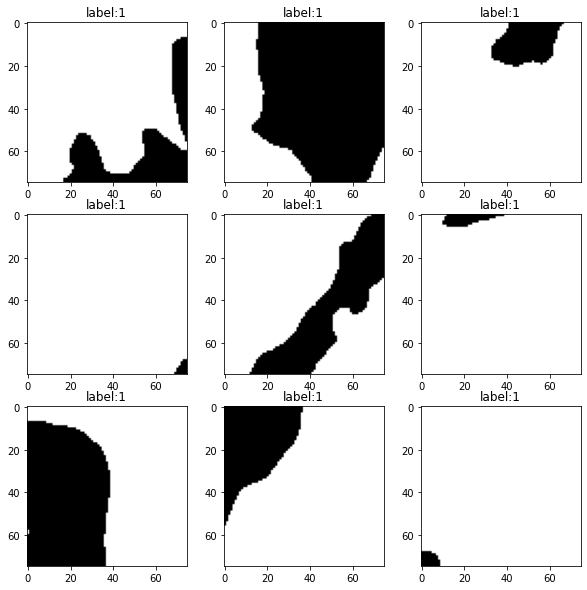

In [ ]:
# Sanity check
# Show 10 cancerous patch_masks

# Plot the masks at the level where patches are extracted
plt.figure(figsize = (10,10))
for i in range(9):
    cancerous_index = tumor_indices[i]

    mask = patch_mask_regions[cancerous_index]
    plt.subplot(3, 3, i + 1)
    plt.imshow(mask, cmap=plt.cm.binary)
    plt.title("label:" + str(patch_labels[cancerous_index]))
plt.show()

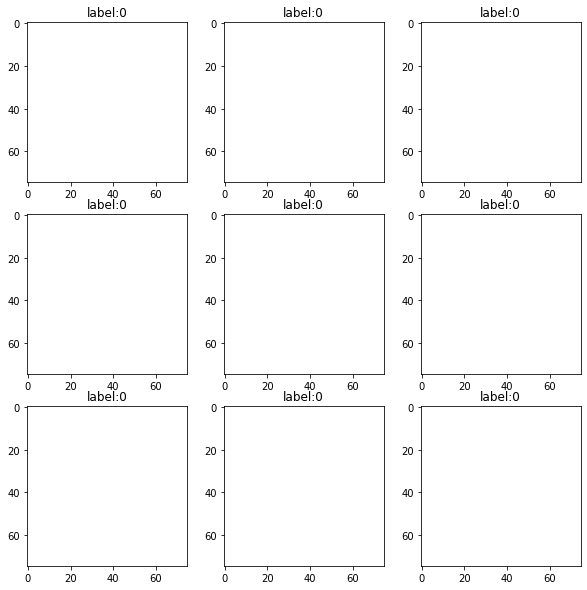

In [ ]:
# Sanity check
# Show 10 normal patch_masks

# Plot the masks at the level where patches are extracted
plt.figure(figsize = (10,10))
for i in range(9):
    normal_index = normal_indices[i]

    mask = patch_mask_regions[normal_index]
    plt.subplot(3, 3, i + 1)
    plt.imshow(mask, cmap=plt.cm.binary)
    plt.title("label:" + str(patch_labels[normal_index]))
plt.show()

## Instruction from Vishu

In [ ]:
# current from level 4
# test set should not include 2 levels


# Next: include level 3 in training dataset, not test 
# Train model on the new training dataset

# lower level 

# Finally include level 3 in tests


#### Seperate the Extracted Data into Cancer Patches and Normal Patches

In [ ]:
cancer_regions = []
cancer_masks = []

for i in tumor_indices:
  cancer_regions.append(patch_regions[i])
  cancer_masks.append(patch_mask_regions[i])


normal_regions = []
normal_masks = []

for i in normal_indices:
  normal_regions.append(patch_regions[i])
  normal_masks.append(patch_mask_regions[i])

#### Split Cancerous Regions and Normal Regions

In [ ]:
# Randomly shuffle the cancer_regions so that the cancerous cell is disordered.
random.shuffle(cancer_regions)

# Split 1/5 cancer_regions as the cancerous test data
split = int(len(cancer_regions)/5)
print(split)
cancer_test = cancer_regions[:split]
print("cancer_test size:", len(cancer_test))

# Split the train and validation dataset
cancer_train, cancer_val = train_test_split(cancer_regions, test_size=0.2)
print("cancer_train size:", len(cancer_train))
print("cancer_val size:", len(cancer_val))

# Create positive labels for all three dataset above
cancer_label_train = np.ones(len(cancer_train))
cancer_label_val = np.ones(len(cancer_val))
cancer_label_test = np.ones(len(cancer_test))


# Sanity test
assert (len(cancer_label_train) == len(cancer_train))
assert (len(cancer_label_val) == len(cancer_val))
assert (len(cancer_label_test) == len(cancer_test))

140
cancer_test size: 140
cancer_train size: 562
cancer_val size: 141


In [ ]:
# Randomly shuffle the normal_regions so that the normal cell is disordered.
random.shuffle(normal_regions)

# Split 1/5 normal_regions as the normal test data
ratio = int(len(normal_regions)/5)
print(ratio)
normal_test = normal_regions[:ratio]
print("normal_test size:", len(normal_test))

# Split the train and validation dataset
normal_train, normal_val = train_test_split(normal_regions, test_size=0.2)
print("normal_train size:", len(normal_train))
print("normal_val size:", len(normal_val))

normal_label_train = np.zeros(len(normal_train))
normal_label_val = np.zeros(len(normal_val))
normal_label_test = np.zeros(len(normal_test))


# Sanity test
assert (len(normal_label_train) == len(normal_train))
assert (len(normal_label_val) == len(normal_val))
assert (len(normal_label_test) == len(normal_test))

1008
normal_test size: 1008
normal_train size: 4033
normal_val size: 1009


In [ ]:
balance_factor = int(len(normal_train)/len(cancer_train))
print(balance_factor)

7


### Custom Data Augmentation

In [ ]:
def data_augmentation(cancer_train):

  result = []
  for can in cancer_train:
    result.append(can)

    # rotate 90
    deg90 = np.rot90(can)
    result.append(deg90)

    # rotate 180
    deg180 = np.rot90(deg90)
    result.append(deg180)
    
    # rotate 270
    deg270 = np.rot90(deg180)
    result.append(deg270)
    
    # flip vertically
    flip_vertical = np.flip(can, axis=0)
    result.append(flip_vertical)
    
    # rotate 90
    deg_v90=np.rot90(flip_vertical)
    result.append(deg_v90)
    
    # rotate 270
    deg_v180=np.rot90(deg_v90)
    deg_v270=np.rot90(deg_v180)
    result.append(deg_v270)

  return result


cancer_train = data_augmentation(cancer_train)

In [ ]:
print("Augmented cancer train dataset: ", len(cancer_train))
print("Normal train dataset: ", len(normal_train))
print("balance_factor: ", len(cancer_train)/len(normal_train))

Augmented cancer train dataset:  3934
Normal train dataset:  4033
balance_factor:  0.9754525167369205


### Concatenate cancerous patches and normal patches together

In [ ]:

patches_train = np.concatenate((cancer_train, normal_train), axis=0)
labels_train = np.concatenate([np.ones(len(cancer_train)), normal_label_train])

patches_val = np.concatenate((cancer_val, normal_val), axis=0)
labels_val = np.concatenate([cancer_label_val, normal_label_val])

patches_test = np.concatenate((cancer_test, normal_test), axis=0)
labels_test = np.concatenate([cancer_label_test, normal_label_test])

In [ ]:
# size of datasets
print("Size of training dataset: ", len(patches_train))
assert len(patches_train) == len(labels_train)
print("Size of validation dataset: ", len(patches_val))
assert len(patches_val) == len(labels_val)
print("Size of test dataset: ", len(patches_test))
assert len(patches_test) == len(labels_test)

Size of training dataset:  7967
Size of validation dataset:  1150
Size of test dataset:  1148


In [ ]:
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Conv2D, Dense, Dropout, MaxPooling2D, Flatten
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import matplotlib.patches as mpatches
import seaborn as sns
import keras.optimizers as optimizers

### Build a ResNet Model

In [ ]:
# import ResNet50 architecture
layer_resnet50 = ResNet50(weights='imagenet',include_top=False, input_shape=(75, 75, 3))

In [ ]:
# add dense layer to ResNet50
# ideal size of final dense layer chosen during parameter tuning
model = Sequential()
model.add(layer_resnet50)
model.add(Flatten())
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
opt = optimizers.RMSprop(learning_rate=0.0001, rho=0.9, epsilon=None, decay=0.0)

In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 3, 3, 2048)        23587712  
                                                                 
 flatten_4 (Flatten)         (None, 18432)             0         
                                                                 
 dense_8 (Dense)             (None, 32)                589856    
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 24,177,601
Trainable params: 24,124,481
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
history = model.fit(x=patches_train, 
                    y=labels_train, 
                    validation_data=(patches_val, labels_val),
                    batch_size=32, 
                    epochs=10)

Epoch 1/10
249/249 [==============================] - 34s 88ms/step - loss: 0.4520 - accuracy: 0.7949 - val_loss: 9.9499 - val_accuracy: 0.7226
Epoch 2/10
249/249 [==============================] - 21s 85ms/step - loss: 0.2723 - accuracy: 0.8969 - val_loss: 1.5272 - val_accuracy: 0.8817
Epoch 3/10
249/249 [==============================] - 21s 84ms/step - loss: 0.1493 - accuracy: 0.9433 - val_loss: 10.5882 - val_accuracy: 0.8930
Epoch 4/10
249/249 [==============================] - 21s 84ms/step - loss: 0.1027 - accuracy: 0.9633 - val_loss: 1.2102 - val_accuracy: 0.9313
Epoch 5/10
249/249 [==============================] - 21s 86ms/step - loss: 0.1002 - accuracy: 0.9760 - val_loss: 0.7204 - val_accuracy: 0.9348
Epoch 6/10
249/249 [==============================] - 21s 84ms/step - loss: 0.0658 - accuracy: 0.9843 - val_loss: 1.3224 - val_accuracy: 0.9270
Epoch 7/10
249/249 [==============================] - 21s 84ms/step - loss: 0.0776 - accuracy: 0.9856 - val_loss: 0.6561 - val_accuracy

### Plot the Accuracy/Loss

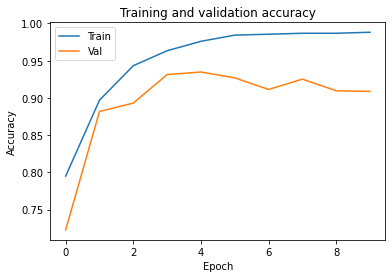

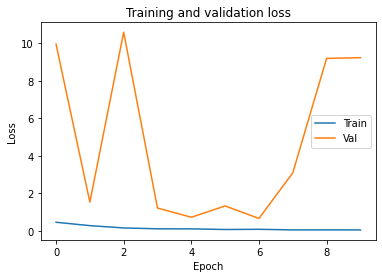

In [ ]:
plot(history)

In [ ]:
# test
model.evaluate(patches_test,labels_test,batch_size=32)

36/36 [==============================] - 1s 23ms/step - loss: 9.8867 - accuracy: 0.9503


[9.886720657348633, 0.950348436832428]

### Save the Model

In [ ]:
# save model
model.save('my_model.h5')

In [ ]:
model = tf.keras.models.load_model('my_model.h5')

### Plot the HeatMap for a Test Slide

In [ ]:
heatmap = create_heatmap(test_slides[0], model, 75, 5)

1/1 [==============================] - 0s 23ms/step


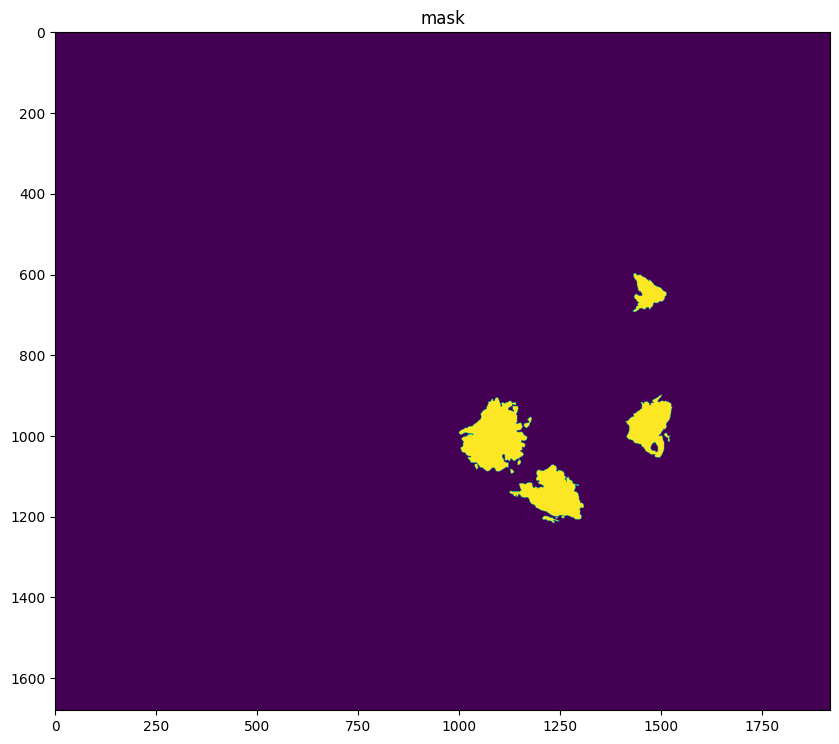

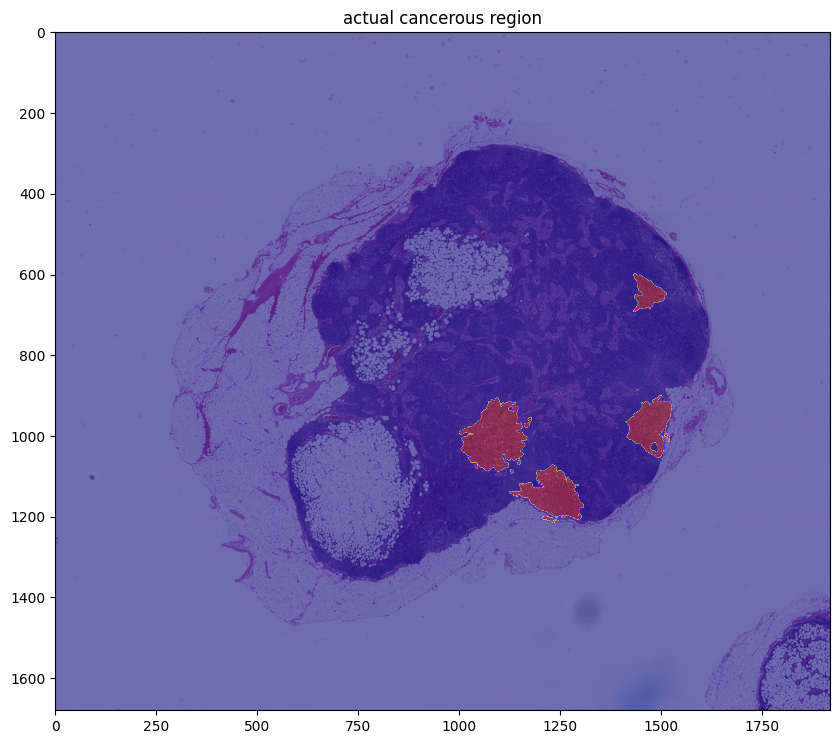

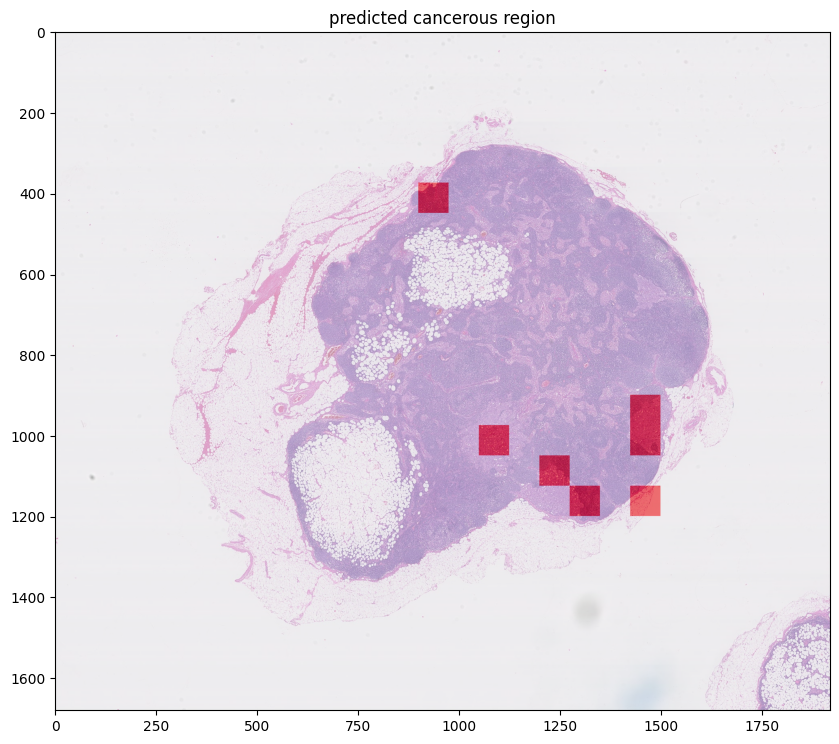

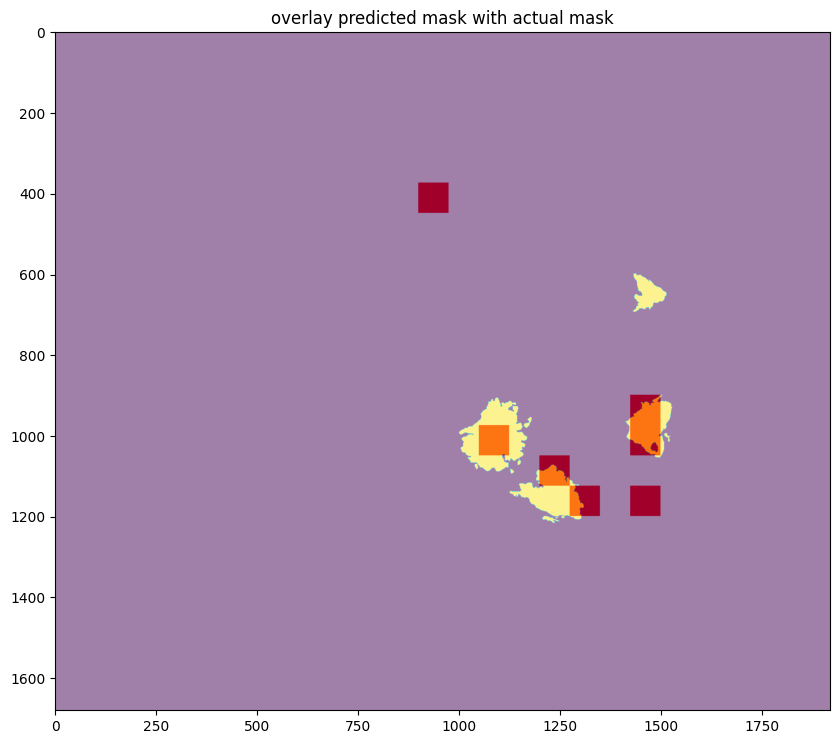

In [ ]:
display_predicted_mask(test_slides[0], heatmap, test_tumor_masks[0], 5)

1/1 [==============================] - 0s 24ms/step


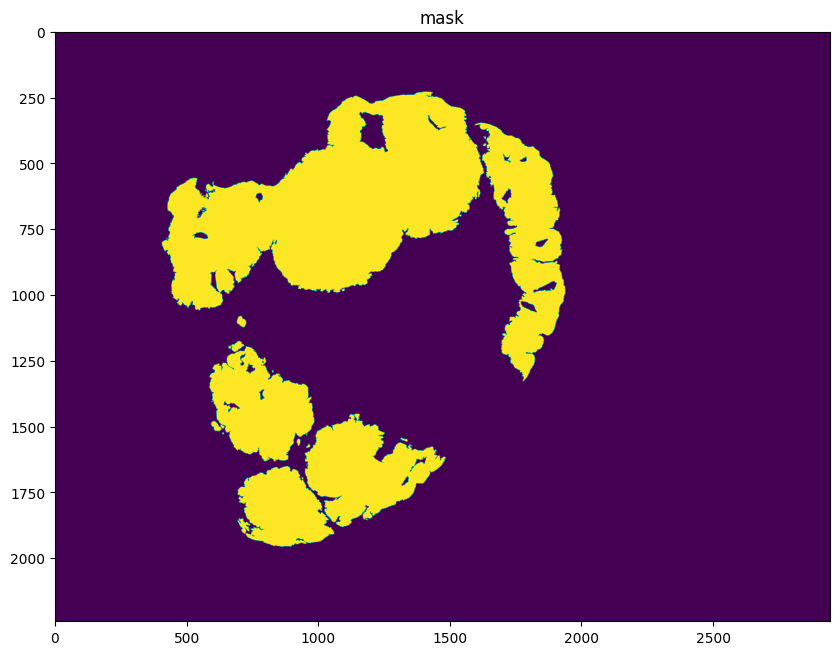

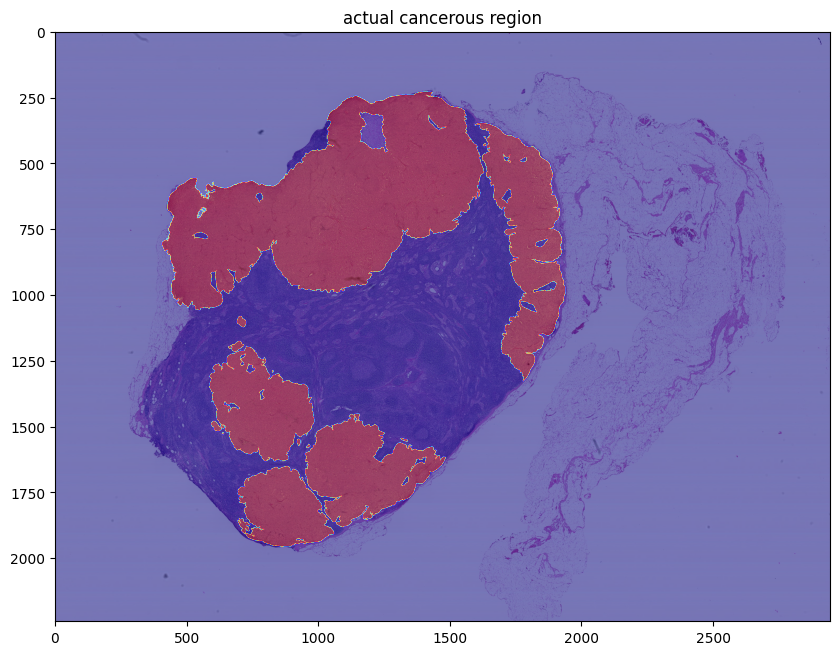

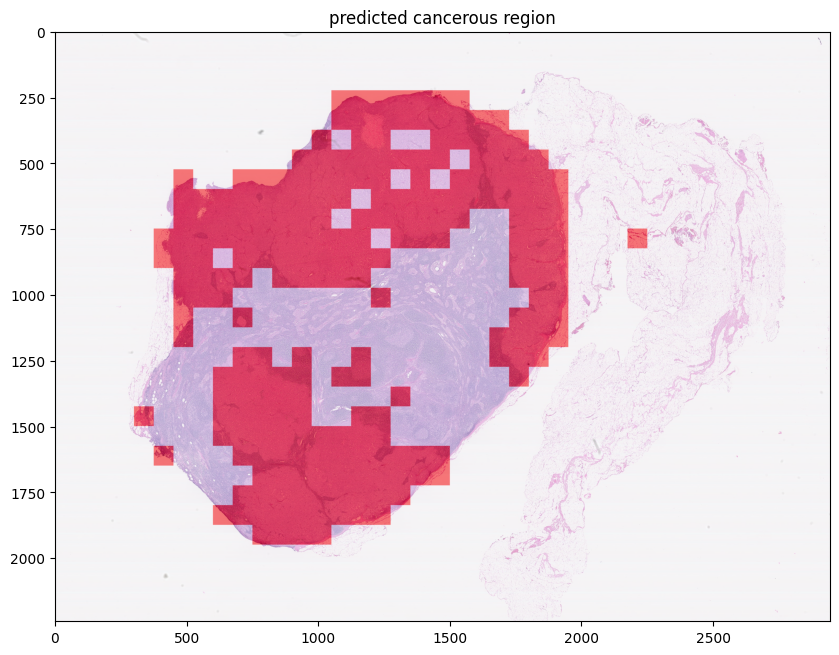

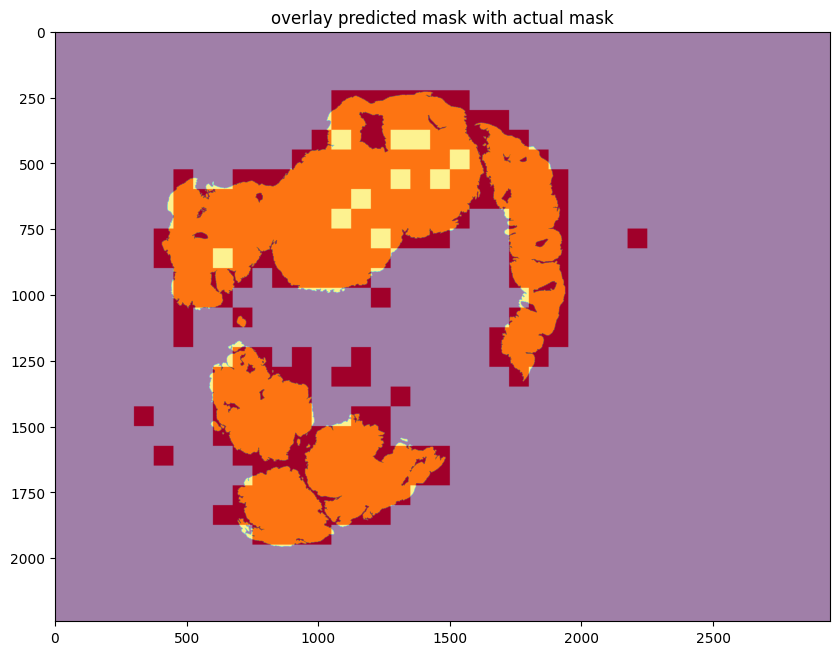

In [ ]:
heatmap = create_heatmap(test_slides[1], model, 75, 5)
display_predicted_mask(test_slides[1], heatmap, test_tumor_masks[1], 5)

## Add patches from level 4

<h2> Only add patches from level 4 in the training dataset and fit these concatenated data into previous ResNet50 model. </h2>

<h3> The precision is expected to be increased since we use higher-resolution patches in the training dataset. 

### Extract patches with size (75, 75) from level 4

In [ ]:
patch_regions_4, patch_mask_regions_4, patch_labels_4 = extract_patches(slides, tumor_masks, 4, 75)

In [ ]:
patch_labels_4 = np.array(patch_labels_4)

### Find the indices for negative patches and positive patches

In [ ]:
tumor_indices_4 = np.nonzero((patch_labels_4==1).astype(int))[0]
normal_indices_4 = np.nonzero((patch_labels_4==0).astype(int))[0]
print("Size of dataset: ", len(patch_regions_4))
print("Cancerous patches: ", len(tumor_indices_4))
print("Normal patches: ", len(normal_indices_4))

Size of dataset:  23149
Cancerous patches:  2111
Normal patches:  21038


In [ ]:
print("Cancerous patches number: ", len(tumor_indices_4))
print("Normal patches number: ", len(normal_indices_4))

Cancerous patches number:  2111
Normal patches number:  21038


In [ ]:
print(tumor_indices_4[:20])

[1476 1477 1478 1479 1484 1485 1497 1498 1499 1500 1501 1504 1505 1506
 1507 1513 1514 1515 1516 1520]


### Seperate the Extracted Data into Cancer Patches and Normal Patches

In [ ]:
cancer_regions_4=[]
cancer_masks_4=[]

for i in tumor_indices_4:
  cancer_regions_4.append(patch_regions_4[i])
  cancer_masks_4.append(patch_mask_regions_4[i])



normal_regions_4=[]
normal_masks_4=[]

for i in normal_indices_4:
  normal_regions_4.append(patch_regions_4[i])
  normal_masks_4.append(patch_mask_regions_4[i])

### Split Cancerious Regions and Normal Regions

In [ ]:
# Randomly shuffle the cancer_regions so that the cancerous cell is disordered.
random.shuffle(cancer_regions_4)

# Split 1/5 cancer_regions as the cancerous test data
split = int(len(cancer_regions_4)/5)
print(split)
cancer_test_4 = cancer_regions_4[:split]
print("cancer_test_4 size:", len(cancer_test))

cancer_train_4, cancer_val_4 = train_test_split(cancer_regions_4, test_size=0.2)
print("cancer_train_4 size:", len(cancer_train_4))
print("cancer_val_4 size:", len(cancer_val_4))


# Create positive labels for all three dataset above
cancer_label_train_4 = np.ones(len(cancer_train_4))
cancer_label_val_4 = np.ones(len(cancer_val_4))
cancer_label_test_4 = np.ones(len(cancer_test_4))



# Sanity test
assert (len(cancer_label_train_4) == len(cancer_train_4))
assert (len(cancer_label_val_4) == len(cancer_val_4))
assert (len(cancer_label_test_4) == len(cancer_test_4))

422
cancer_test_4 size: 140
cancer_train_4 size: 1688
cancer_val_4 size: 423


In [ ]:
# Randomly shuffle the norma_regions_4 so that the cancerous cell is disordered.
random.shuffle(normal_regions_4)

# Split 1/5 normal_regions as the cancerous test data
split = int(len(normal_regions_4)/5)
print(split)
normal_test_4 = normal_regions_4[:split]
print("normal_test_4 size:", len(normal_test_4))


normal_train_4, normal_val_4 = train_test_split(normal_regions_4, test_size=0.2)
print("normal_train_4 size:", len(normal_train_4))
print("normal_val_4 size:", len(normal_val_4))


# Create negative labels for all three dataset above
normal_label_train_4 = np.zeros(len(normal_train_4)) 
normal_label_val_4 = np.zeros(len(normal_val_4))
normal_label_test_4 = np.zeros(len(normal_test_4))



# Sanity test
assert (len(normal_label_train_4) == len(normal_train_4))
assert (len(normal_label_val_4) == len(normal_val_4))
assert (len(normal_label_test_4) == len(normal_test_4))

4207
normal_test_4 size: 4207
normal_train_4 size: 16830
normal_val_4 size: 4208


In [ ]:
balance_factor = int(len(normal_train_4) / len(cancer_train_4))
print(balance_factor)

9


### Custom Data Augmentation

In [ ]:
def data_augmentation_level_4(cancer_train_4):

  result = []
  for can in cancer_train_4:
    result.append(can)

    # rotate 90
    deg90 = np.rot90(can)
    result.append(deg90)

    # rotate 180
    deg180 = np.rot90(deg90)
    result.append(deg180)
    
    # rotate 270
    deg270 = np.rot90(deg180)
    result.append(deg270)
    
    # flip vertically
    flip_vertical = np.flip(can, axis=0)
    result.append(flip_vertical)
    
    # rotate 90
    deg_v90=np.rot90(flip_vertical)
    result.append(deg_v90)
    

    # rotate 180
    deg_v180=np.rot90(deg_v90)
    result.append(deg_v180)

    # rotate 270
    deg_v270=np.rot90(deg_v180)
    result.append(deg_v270)

  return result

In [ ]:
cancer_train_4 = data_augmentation_level_4(cancer_train_4)

In [ ]:
# now we have a balanced data set for training
print("Augmented cancer train dataset: ", len(cancer_train_4))
print("Normal train dataset: ", len(normal_train_4))

Augmented cancer train dataset:  13504
Normal train dataset:  16830


In [ ]:

patches_train_4 = np.concatenate((cancer_train_4, normal_train_4), axis=0)
labels_train_4 = np.concatenate([np.ones(len(cancer_train_4)), normal_label_train_4])

patches_val_4 = np.concatenate((cancer_val_4, normal_val_4), axis=0)
labels_val_4 = np.concatenate([cancer_label_val_4, normal_label_val_4])

patches_test_4 = np.concatenate((cancer_test_4, normal_test_4), axis=0)
labels_test_4 = np.concatenate([cancer_label_test_4, normal_label_test_4])

In [ ]:
# size of datasets
print("Size of training dataset: ", len(patches_train_4))
assert len(patches_train_4) == len(labels_train_4)
print("Size of validation dataset: ", len(patches_val_4))
assert len(patches_val_4) == len(labels_val_4)
print("Size of test dataset: ", len(patches_test_4))
assert len(patches_test_4) == len(labels_test_4)

Size of training dataset:  30334
Size of validation dataset:  4631
Size of test dataset:  4629


### Concatenate the patches from level 4 and level 5 to test set together

In [ ]:
patches_train_total = np.concatenate((patches_train, patches_train_4), axis = 0)
labels_train_total = np.concatenate((labels_train, labels_train_4))

In [ ]:
print(patches_train_total.shape)

(38301, 75, 75, 3)


In [ ]:
print(labels_train_total.shape)

(38301,)


### Load previous model and fit the new training dataset into it

In [ ]:
model = tf.keras.models.load_model('my_model.h5')

In [ ]:
history = model.fit(x=patches_train_total, y=labels_train_total, 
                    validation_data=(patches_val, labels_val),
                    batch_size=32, epochs=10)

Epoch 1/10
1197/1197 [==============================] - 106s 83ms/step - loss: 0.2515 - accuracy: 0.9122 - val_loss: 0.2947 - val_accuracy: 0.9070
Epoch 2/10
1197/1197 [==============================] - 97s 81ms/step - loss: 0.1640 - accuracy: 0.9418 - val_loss: 0.3578 - val_accuracy: 0.9287
Epoch 3/10
1197/1197 [==============================] - 97s 81ms/step - loss: 0.1309 - accuracy: 0.9570 - val_loss: 0.3864 - val_accuracy: 0.9261
Epoch 4/10
1197/1197 [==============================] - 97s 81ms/step - loss: 0.1027 - accuracy: 0.9693 - val_loss: 0.5582 - val_accuracy: 0.9348
Epoch 5/10
1197/1197 [==============================] - 97s 81ms/step - loss: 0.0813 - accuracy: 0.9739 - val_loss: 1.1043 - val_accuracy: 0.8878
Epoch 6/10
1197/1197 [==============================] - 98s 82ms/step - loss: 0.0778 - accuracy: 0.9785 - val_loss: 1.0464 - val_accuracy: 0.8722
Epoch 7/10
1197/1197 [==============================] - 97s 81ms/step - loss: 0.0692 - accuracy: 0.9824 - val_loss: 0.5935 

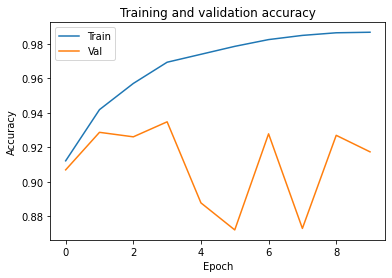

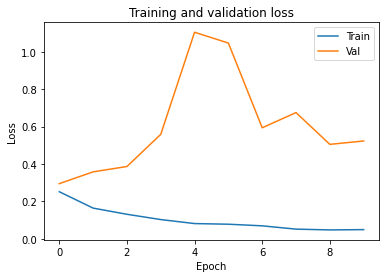

In [ ]:
# The history object contains results on the training and test
plot(history)

In [ ]:
# test
model.evaluate(patches_test,labels_test,batch_size=32)

36/36 [==============================] - 1s 23ms/step - loss: 1.3030 - accuracy: 0.9774


[1.3029853105545044, 0.9773519039154053]

<h3> This result confirms our hypothesis. The loss is decreased greatly and the accuracy is better then previous one.

### Plot the HeatMap for a Test Slide

In [ ]:
heatmap = create_heatmap(test_slides[1], model, 75, 5)

1/1 [==============================] - 0s 25ms/step


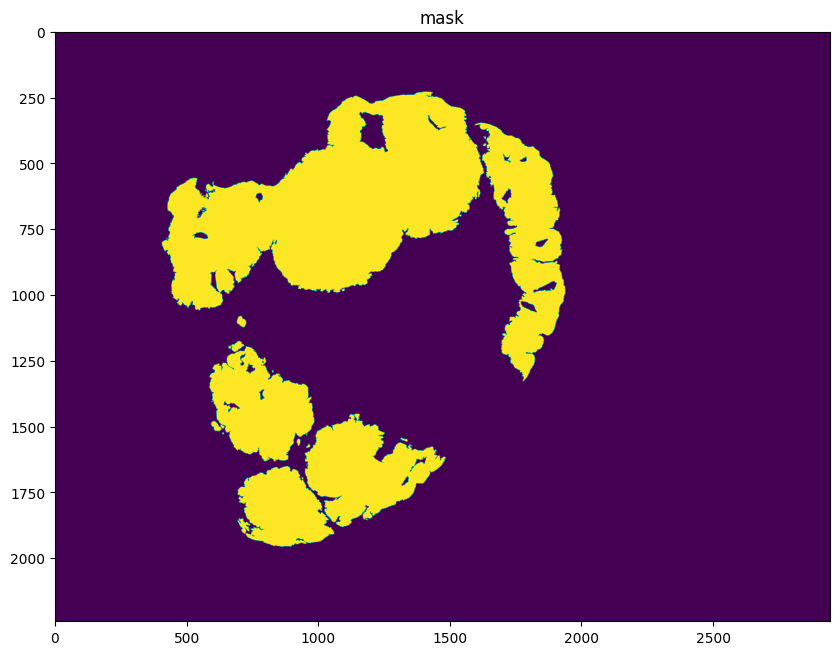

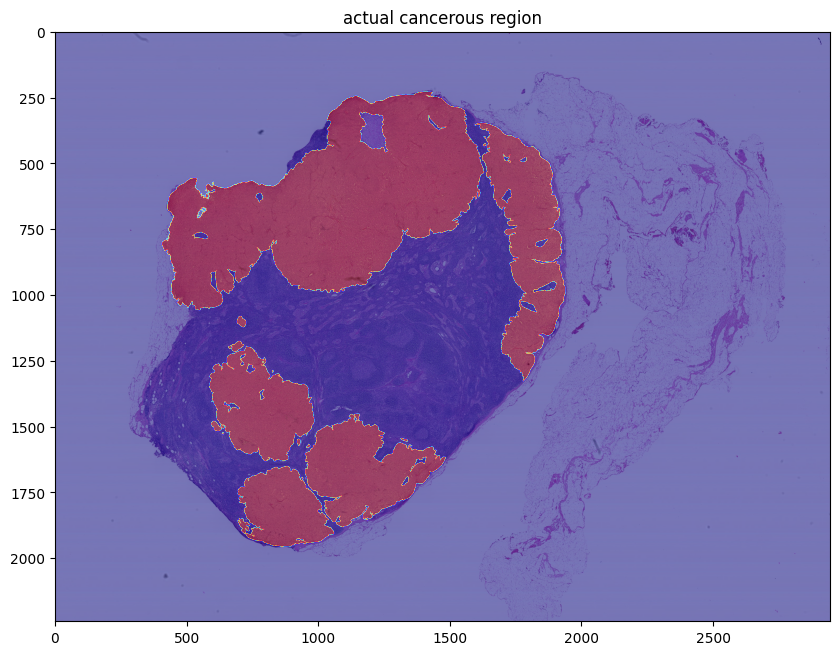

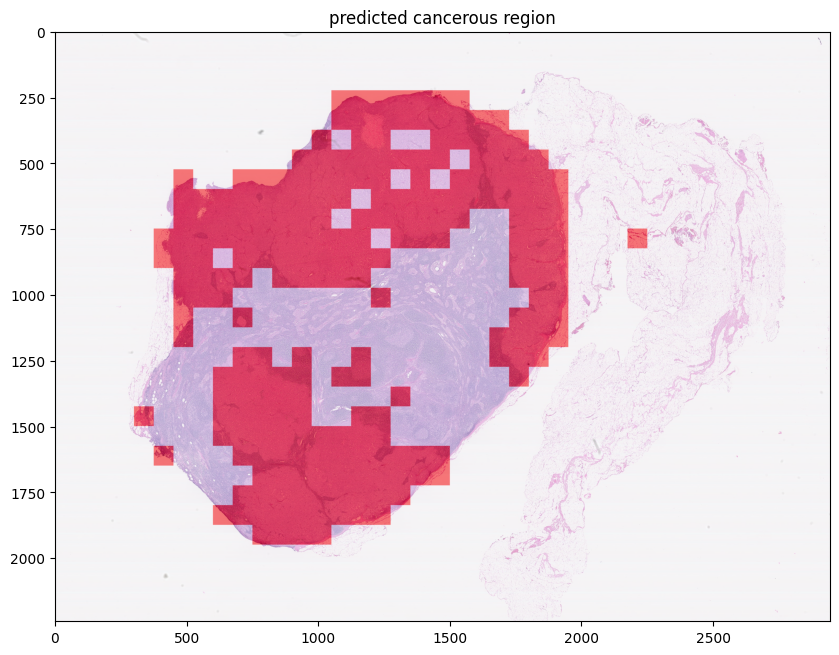

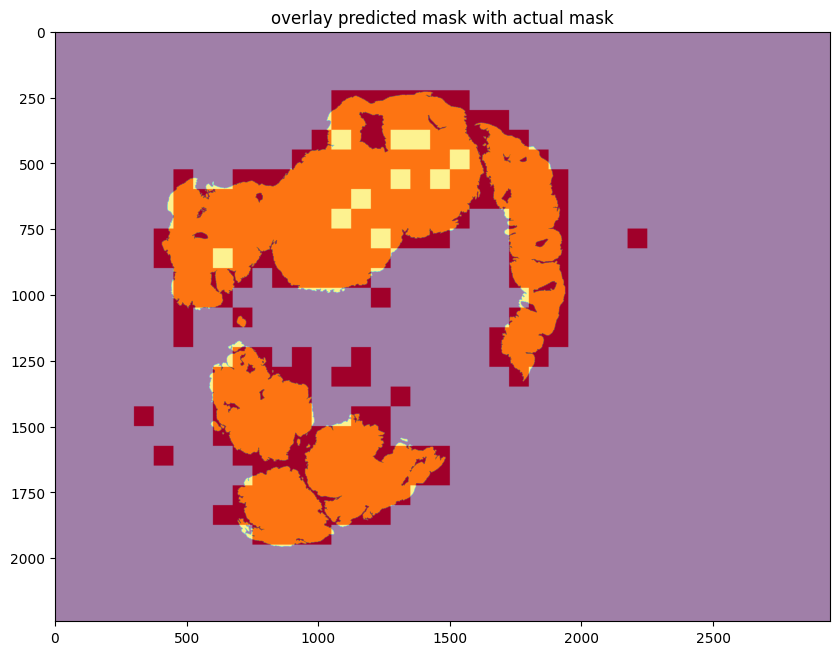

In [ ]:
display_predicted_mask(test_slides[1] ,heatmap, test_tumor_masks[1], 5)

1/1 [==============================] - 0s 25ms/step


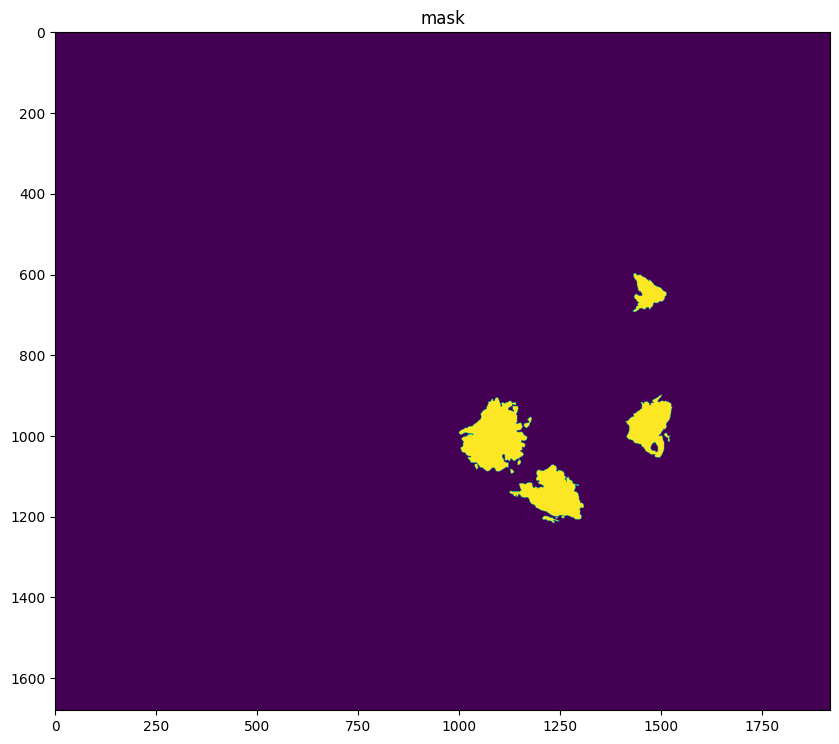

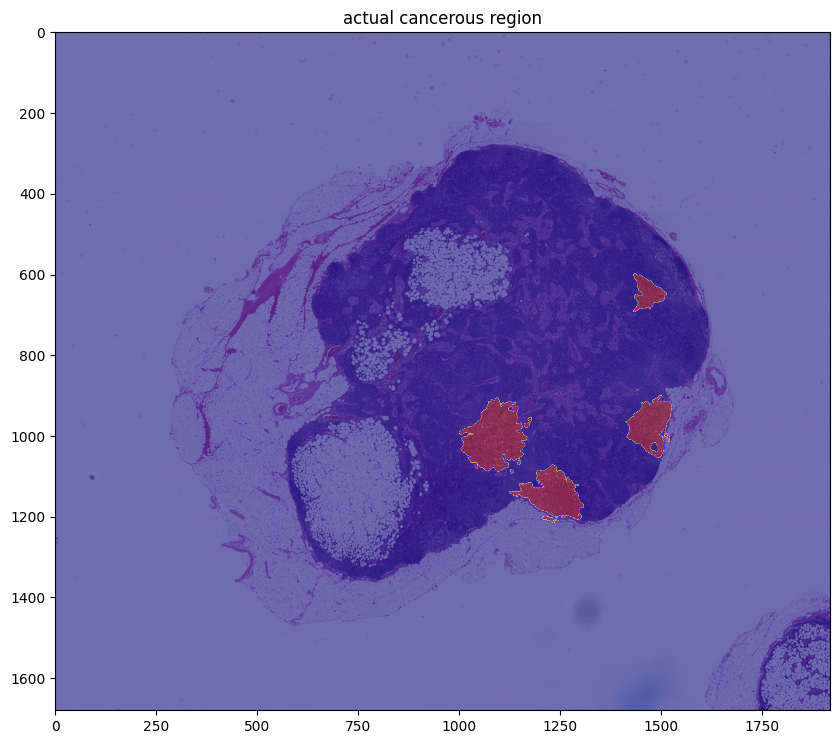

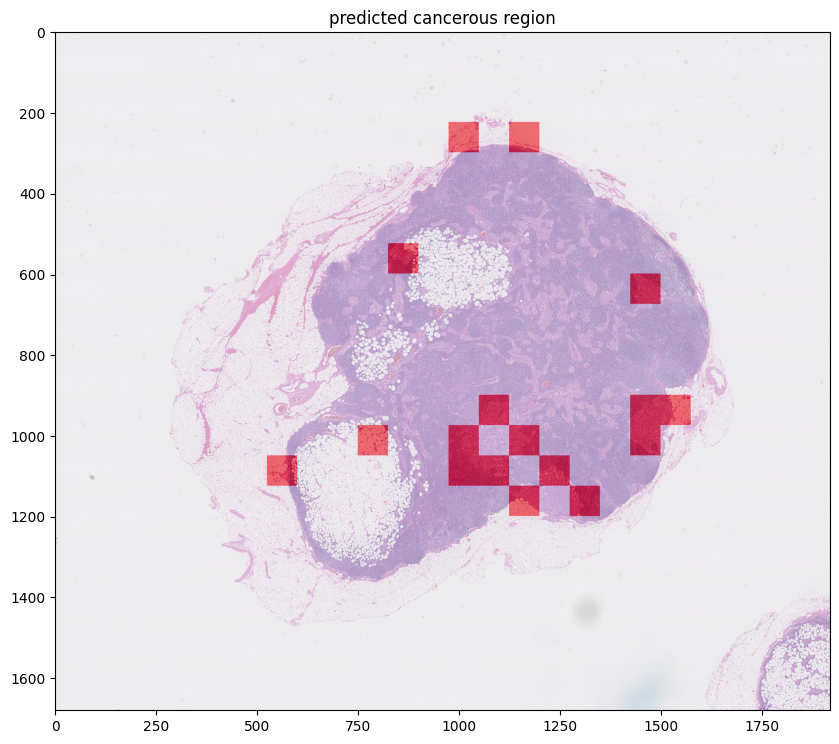

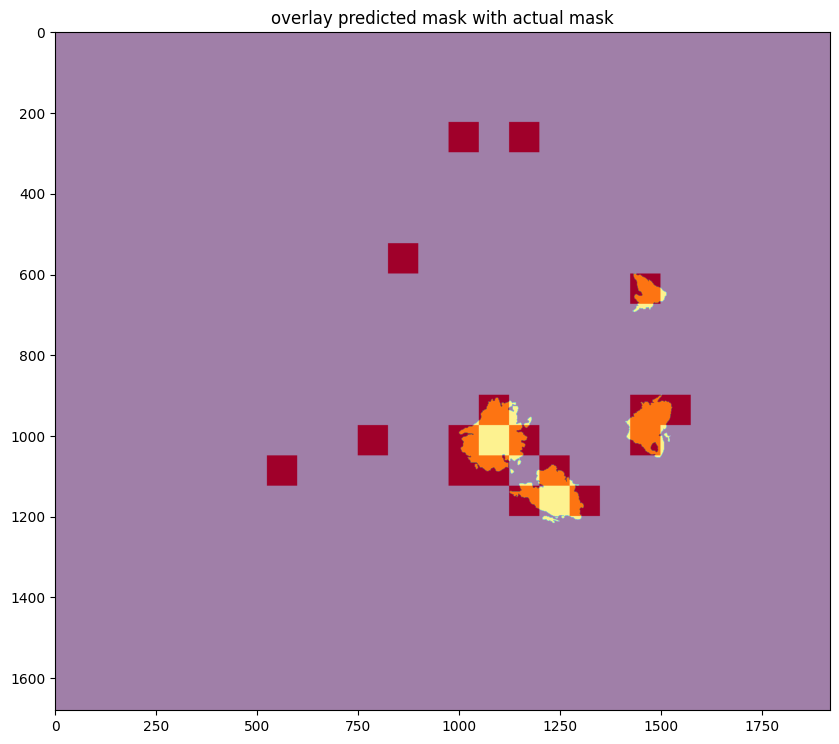

In [ ]:
heatmap_test_0 = create_heatmap(test_slides[0], model, 75, 5)
display_predicted_mask(test_slides[0] ,heatmap_test_0, test_tumor_masks[0], 5)

## Add test and validation patches from level 4 and retrain the ResNet50 model

In [ ]:
# Concatenate test patches from level 4 with original patches (from level 5)
patches_test_total = np.concatenate((patches_test, patches_test_4), axis = 0)
labels_test_total = np.concatenate((labels_test, labels_test_4))

# Concatenate validation patches from level 4 with original patches (from level 5)
patches_val_total = np.concatenate((patches_val, patches_val_4), axis = 0)
labels_val_total = np.concatenate((labels_val, labels_val_4))

In [ ]:
# Sanity check the shape after concatenation
assert patches_test_total.shape[0] == (patches_test.shape[0] + patches_test_4.shape[0])

In [ ]:
assert patches_val_total.shape[0] == (patches_val.shape[0] + patches_val_4.shape[0])

### Build the New ResNet Model and Train this Model

In [ ]:
multiple_level_base_layer = ResNet50(weights='imagenet',include_top=False, input_shape=(75, 75, 3))

In [ ]:
multi_level_model = Sequential()
multi_level_model.add(multiple_level_base_layer)
multi_level_model.add(Flatten())
multi_level_model.add(Dense(32, activation='relu'))
multi_level_model.add(Dense(1, activation='sigmoid'))

In [ ]:
opt = optimizers.RMSprop(learning_rate=0.0001, rho=0.8, decay=0.0)

In [ ]:
multi_level_model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [ ]:
multi_level_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 3, 3, 2048)        23587712  
                                                                 
 flatten_5 (Flatten)         (None, 18432)             0         
                                                                 
 dense_10 (Dense)            (None, 32)                589856    
                                                                 
 dense_11 (Dense)            (None, 1)                 33        
                                                                 
Total params: 24,177,601
Trainable params: 24,124,481
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
history = multi_level_model.fit(x=patches_train_total, 
                                y=labels_train_total, 
                                validation_data=(patches_val_total, labels_val_total),
                                batch_size=32,
                                epochs=10)

Epoch 1/10
1197/1197 [==============================] - 115s 86ms/step - loss: 0.3151 - accuracy: 0.8752 - val_loss: 6.5845 - val_accuracy: 0.8990
Epoch 2/10
1197/1197 [==============================] - 101s 84ms/step - loss: 0.2335 - accuracy: 0.9180 - val_loss: 0.3905 - val_accuracy: 0.9251
Epoch 3/10
1197/1197 [==============================] - 101s 85ms/step - loss: 0.1957 - accuracy: 0.9329 - val_loss: 0.4003 - val_accuracy: 0.9531
Epoch 4/10
1197/1197 [==============================] - 101s 84ms/step - loss: 0.1656 - accuracy: 0.9434 - val_loss: 0.3075 - val_accuracy: 0.9272
Epoch 5/10
1197/1197 [==============================] - 101s 84ms/step - loss: 0.1333 - accuracy: 0.9539 - val_loss: 1.1286 - val_accuracy: 0.9263
Epoch 6/10
1197/1197 [==============================] - 101s 84ms/step - loss: 0.1236 - accuracy: 0.9607 - val_loss: 107.9669 - val_accuracy: 0.8268
Epoch 7/10
1197/1197 [==============================] - 102s 85ms/step - loss: 0.1111 - accuracy: 0.9637 - val_loss:

### Plot the Accuracy/Loss

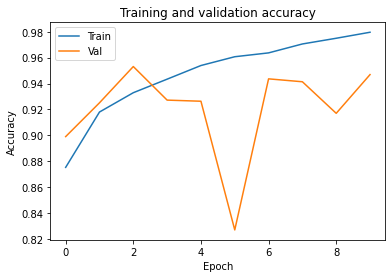

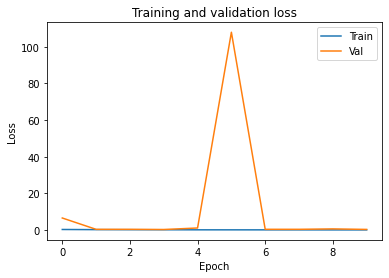

In [ ]:
plot(history)

### Evaluate the Model

In [ ]:

multi_level_model.evaluate(patches_test_total,labels_test_total,batch_size=32)

181/181 [==============================] - 4s 23ms/step - loss: 0.0972 - accuracy: 0.9825


[0.09724444150924683, 0.982516884803772]

### Save the Model

In [ ]:
# save model
model.save('multi_level_model.h5')

In [ ]:
multi_level_model = tf.keras.models.load_model('multi_level_model.h5')

### Plot the HeatMap for a Test Slide

In [ ]:
heatmap = create_heatmap(test_slides[0], multi_level_model, 75, 5)

1/1 [==============================] - 0s 26ms/step


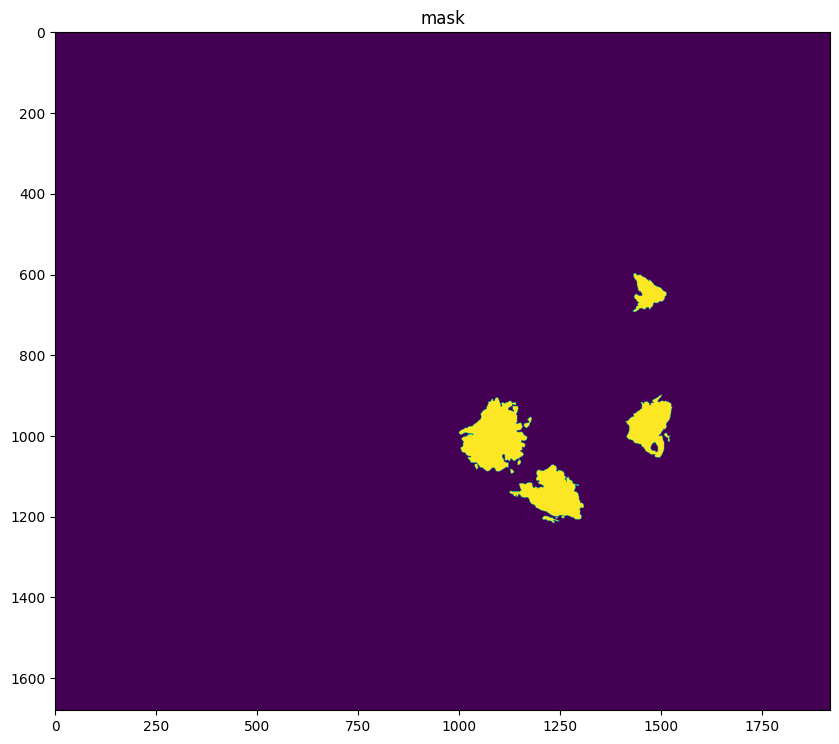

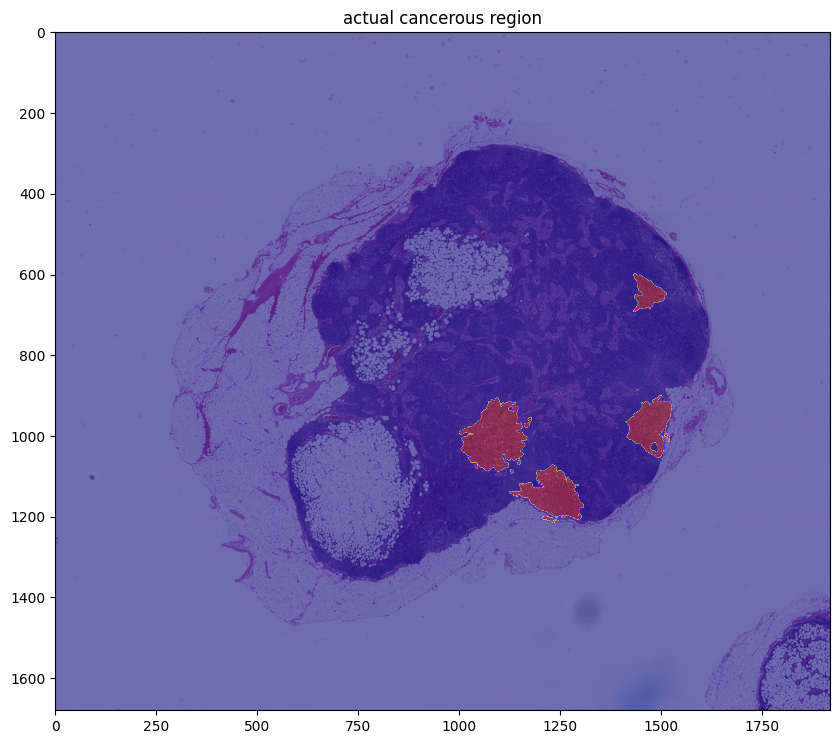

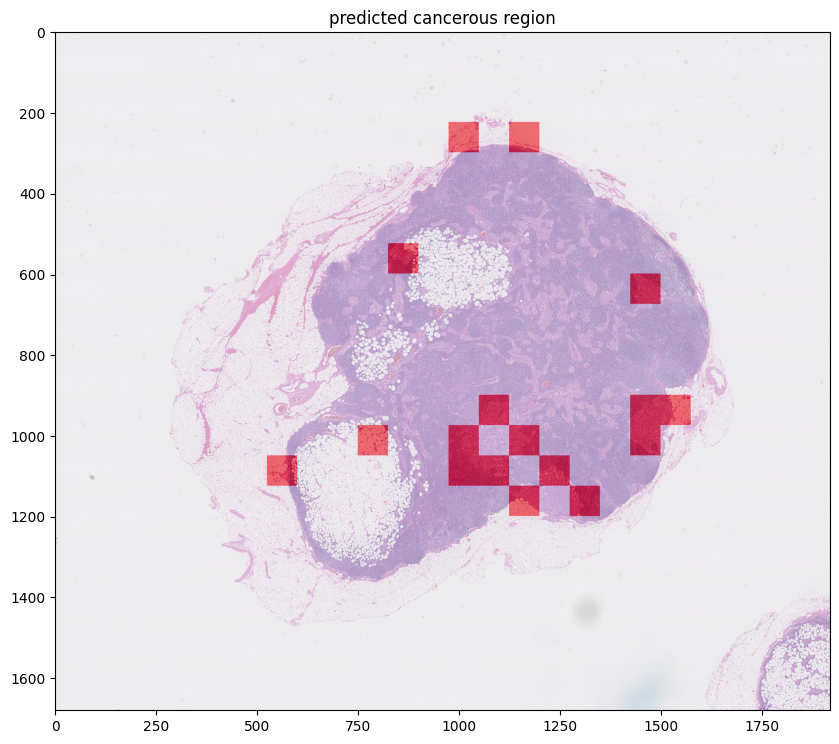

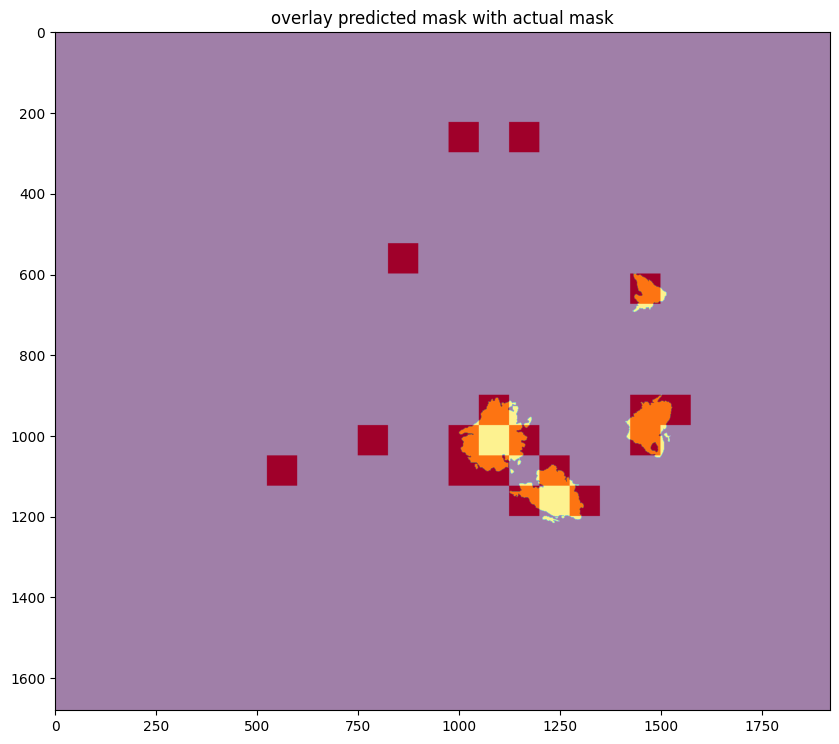

In [ ]:
display_predicted_mask(test_slides[0], heatmap, test_tumor_masks[0], 5)

In [ ]:
heatmap = create_heatmap(test_slides[1], multi_level_model, 75, 5)

1/1 [==============================] - 0s 27ms/step


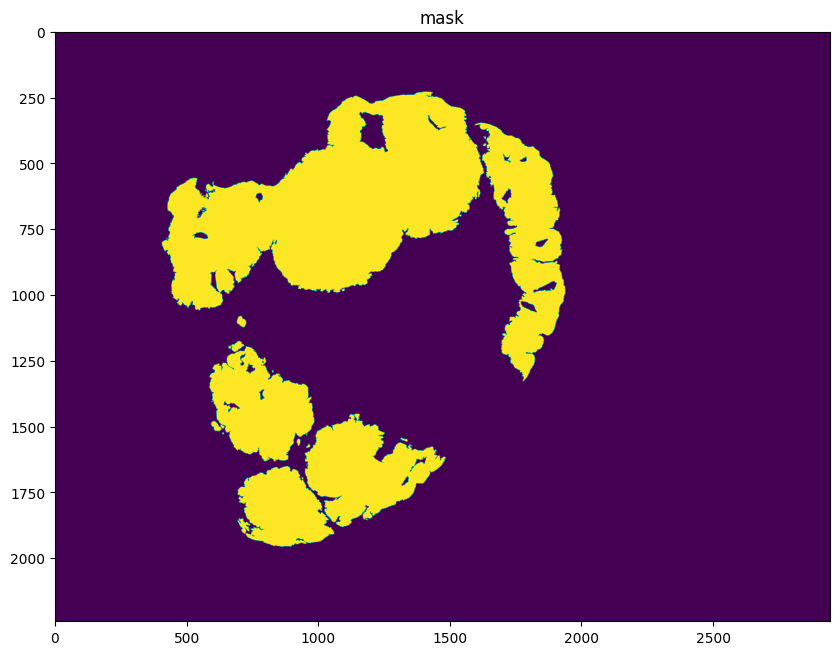

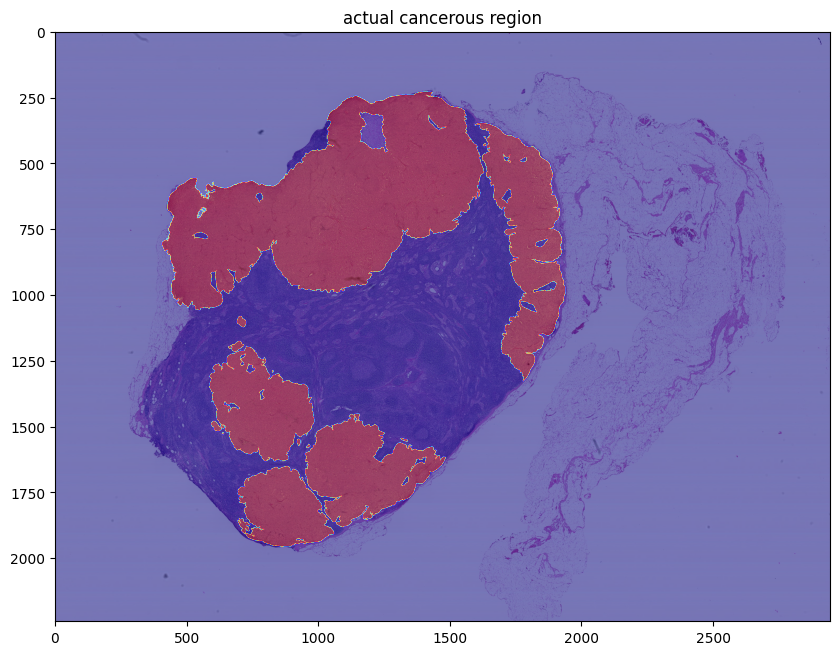

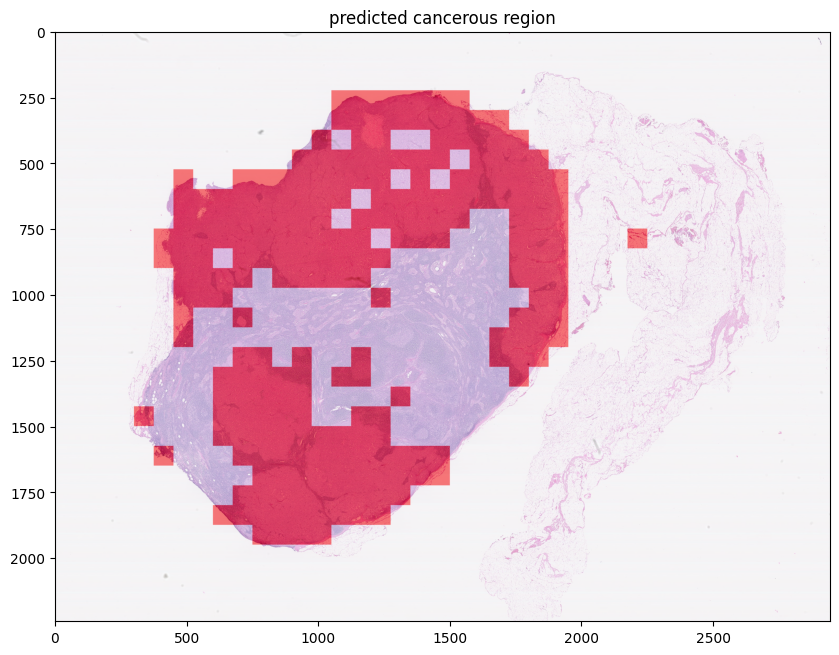

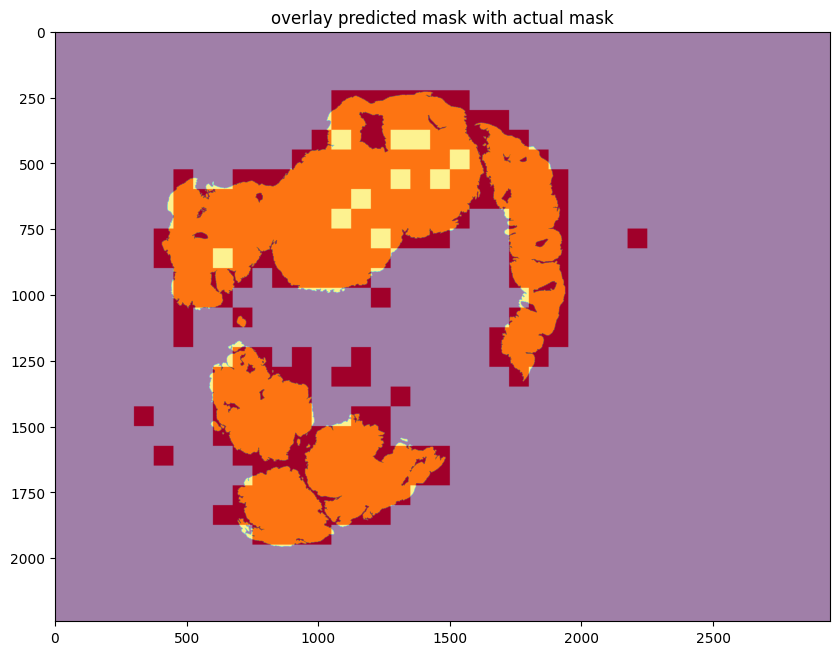

In [ ]:
# test_tumor_masks[1], 5
display_predicted_mask(test_slides[1], heatmap, test_tumor_masks[1], 5)